# XMM-LSS master catalogue
## Checks and diagnostics

In [1]:
from herschelhelp_internal import git_version
print("This notebook was run with herschelhelp_internal version: \n{}".format(git_version()))
import datetime
print("This notebook was executed on: \n{}".format(datetime.datetime.now()))

This notebook was run with herschelhelp_internal version: 
0246c5d (Thu Jan 25 17:01:47 2018 +0000) [with local modifications]
This notebook was executed on: 
2018-02-21 23:51:15.510091


In [2]:
%matplotlib inline
#%config InlineBackend.figure_format = 'svg'

import matplotlib.pyplot as plt
plt.rc('figure', figsize=(10, 6))
plt.style.use('ggplot')

import locale
locale.setlocale(locale.LC_ALL, 'en_GB')

import os
import time
import itertools

from astropy.coordinates import SkyCoord
from astropy.table import Table
from astropy import units as u
from astropy import visualization as vis
import numpy as np
from matplotlib_venn import venn3

from herschelhelp_internal.masterlist import (nb_compare_mags, nb_ccplots, nb_histograms, 
                                              quick_checks, find_last_ml_suffix)

In [3]:
OUT_DIR = os.environ.get('OUT_DIR', "./data")
SUFFIX = find_last_ml_suffix()
#SUFFIX = "20171016"

master_catalogue_filename = "master_catalogue_xmm-lss_{}.fits".format(SUFFIX)
master_catalogue = Table.read("{}/{}".format(OUT_DIR, master_catalogue_filename))

print("Diagnostics done using: {}".format(master_catalogue_filename))

Diagnostics done using: master_catalogue_xmm-lss_20180221.fits


## 0 - Quick checks

In [4]:
quick_checks(master_catalogue).show_in_notebook()

/opt/anaconda3/envs/herschelhelp_internal/lib/python3.6/site-packages/numpy/core/numeric.py:301: FutureWarning: in the future, full(381, False) will return an array of dtype('bool')
  format(shape, fill_value, array(fill_value).dtype), FutureWarning)
/opt/anaconda3/envs/herschelhelp_internal/lib/python3.6/site-packages/numpy/core/numeric.py:301: FutureWarning: in the future, full(381, 0) will return an array of dtype('int64')
  format(shape, fill_value, array(fill_value).dtype), FutureWarning)


Table shows only problematic columns.


idx,Column,All nan,#Measurements,#Zeros,#Negative,Minimum value
0,f_acs_f606w,False,28751,0,631,-0.146337
1,f_ap_acs_f606w,False,28754,0,2020,-1.04212
2,f_acs_f814w,False,28750,0,363,-0.473682
3,f_ap_acs_f814w,False,28753,0,1381,-0.221474
4,f_wfc3_f125w,False,35714,0,355,-0.868321
5,f_ap_wfc3_f125w,False,35718,0,1304,-0.823528
6,f_wfc3_f160w,False,35752,0,1,-0.0136137
7,f_ap_wfc3_f160w,False,35931,0,683,-0.22035
8,f_suprime_b,False,916286,0,776,-51.9175224
9,ferr_suprime_b,False,916282,12,0,0.0


## I - Summary of wavelength domains

In [5]:
flag_obs = master_catalogue['flag_optnir_obs']
flag_det = master_catalogue['flag_optnir_det']

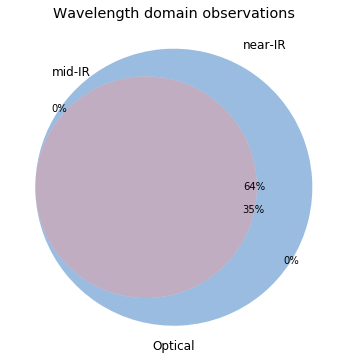

In [6]:
venn3(
    [
        np.sum(flag_obs == 4),
        np.sum(flag_obs == 2),
        np.sum(flag_obs == 6),
        np.sum(flag_obs == 1),
        np.sum(flag_obs == 5),
        np.sum(flag_obs == 3),
        np.sum(flag_obs == 7)
    ],
    set_labels=('mid-IR', 'near-IR', 'Optical'),
    subset_label_formatter=lambda x: "{}%".format(int(100*x/len(flag_obs)))
)
plt.title("Wavelength domain observations");

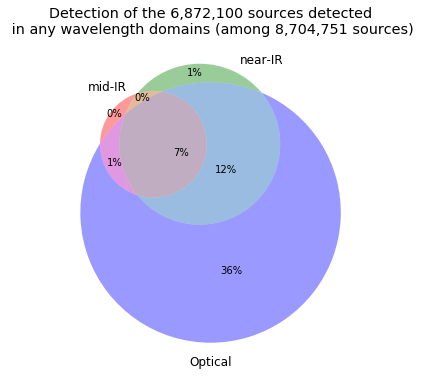

In [7]:
venn3(
    [
        np.sum(flag_det[flag_obs == 7] == 4),
        np.sum(flag_det[flag_obs == 7] == 2),
        np.sum(flag_det[flag_obs == 7] == 6),
        np.sum(flag_det[flag_obs == 7] == 1),
        np.sum(flag_det[flag_obs == 7] == 5),
        np.sum(flag_det[flag_obs == 7] == 3),
        np.sum(flag_det[flag_obs == 7] == 7)
    ],
    set_labels=('mid-IR', 'near-IR', 'Optical'),
    subset_label_formatter=lambda x: "{}%".format(int(100*x/np.sum(flag_det != 0)))
)
plt.title("Detection of the {} sources detected\n in any wavelength domains "
          "(among {} sources)".format(
              locale.format('%d', np.sum(flag_det != 0), grouping=True),
              locale.format('%d', len(flag_det), grouping=True)));

## II - Comparing magnitudes in similar filters

The master list if composed of several catalogues containing magnitudes in similar filters on different instruments. We are comparing the magnitudes in these corresponding filters.

In [8]:
u_bands = ["Megacam u"]
g_bands = ["Megacam g", "SUPRIME g", "GPC1 g", "DECam g"]
r_bands = ["Megacam r", "SUPRIME r", "GPC1 r", "DECam r"]
i_bands = ["Megacam i", "SUPRIME i", "GPC1 i", "DECam i" ]
z_bands = ["Megacam z", "SUPRIME z", "GPC1 z", "DECam z", "VISTA Z"]
y_bands = ["Megacam y", "SUPRIME y", "GPC1 y", "DECam y", "VISTA Y"]
j_bands = [                                               "VISTA J",  "UKIDSS J", "WIRCAM J"]
h_bands = [                                               "VISTA H",  "UKIDSS H", "WIRCAM H"]
k_bands = [                                               "VISTA Ks", "UKIDSS K", "WIRCAM Ks"]

### II.a - Comparing depths

We compare the histograms of the total aperture magnitudes of similar bands.

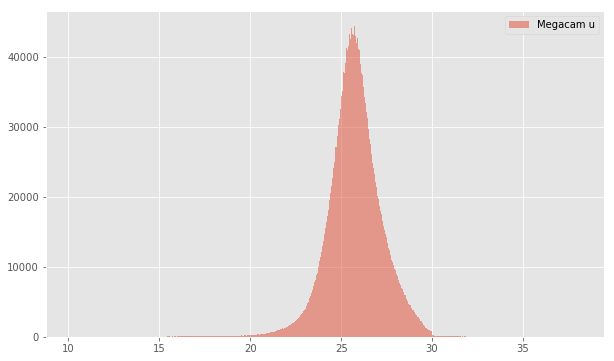

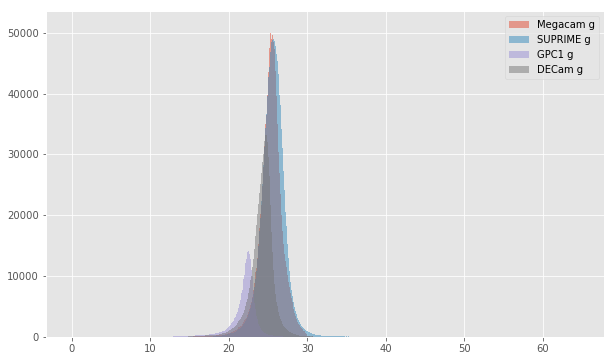

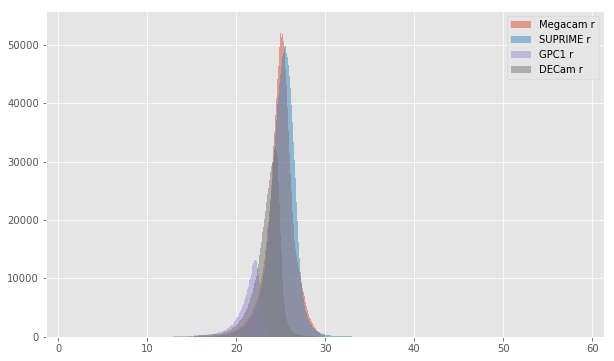

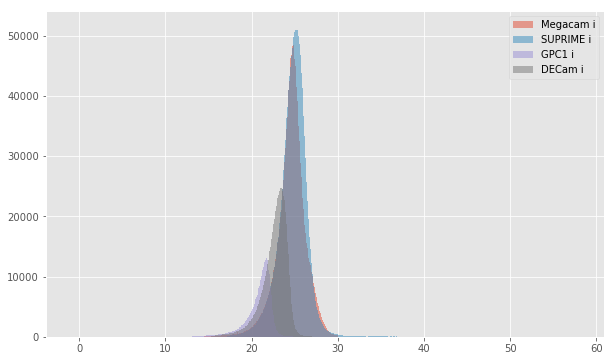

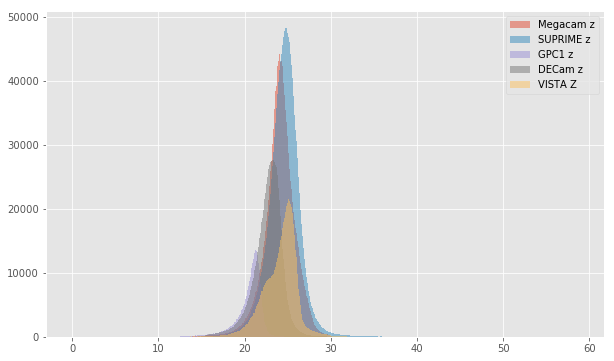

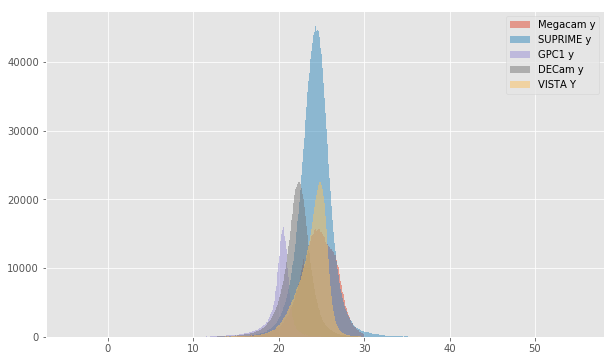

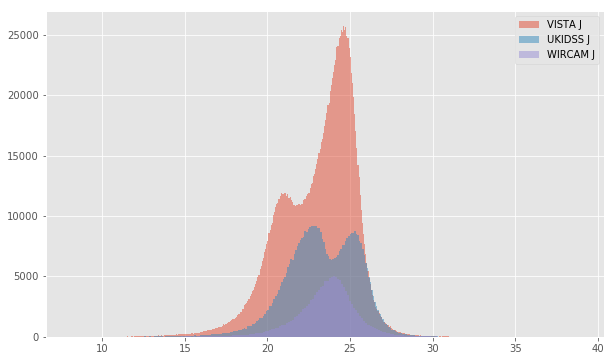

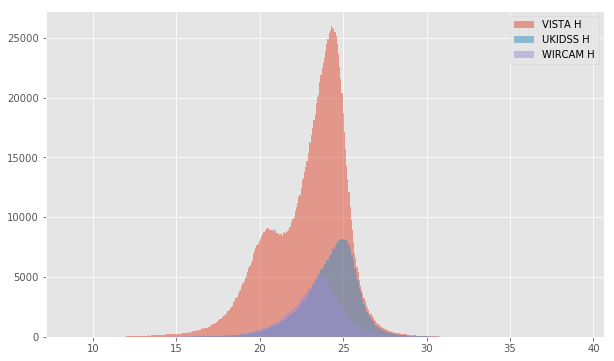

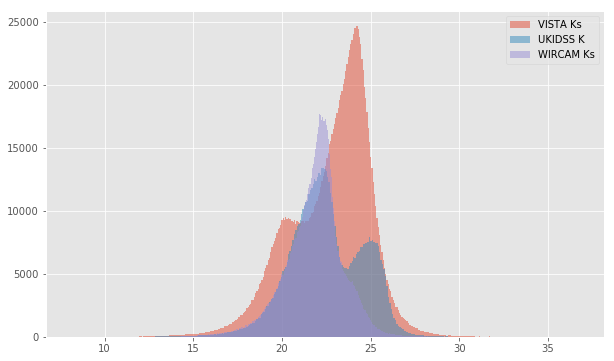

In [9]:
for bands in [u_bands, g_bands, r_bands, i_bands, z_bands, y_bands, j_bands, h_bands, k_bands]:
    colnames = ["m_{}".format(band.replace(" ", "_").lower()) for band in bands]
    nb_histograms(master_catalogue, colnames, bands)

### II.b - Comparing magnitudes

We compare one to one each magnitude in similar bands.

SUPRIME g (aperture) - Megacam g (aperture):
- Median: -0.04
- Median Absolute Deviation: 0.17
- 1% percentile: -1.4489594459533692
- 99% percentile: 2.01410663604735


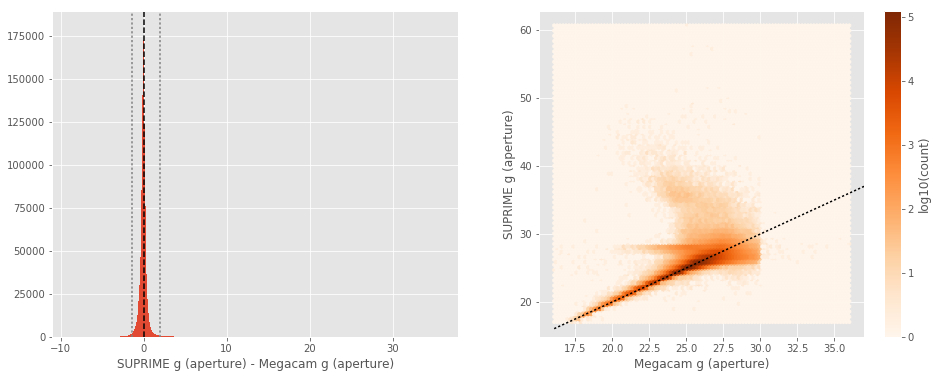

SUPRIME g (total) - Megacam g (total):
- Median: -0.09
- Median Absolute Deviation: 0.24
- 1% percentile: -2.283849220275879
- 99% percentile: 2.3356558609008804


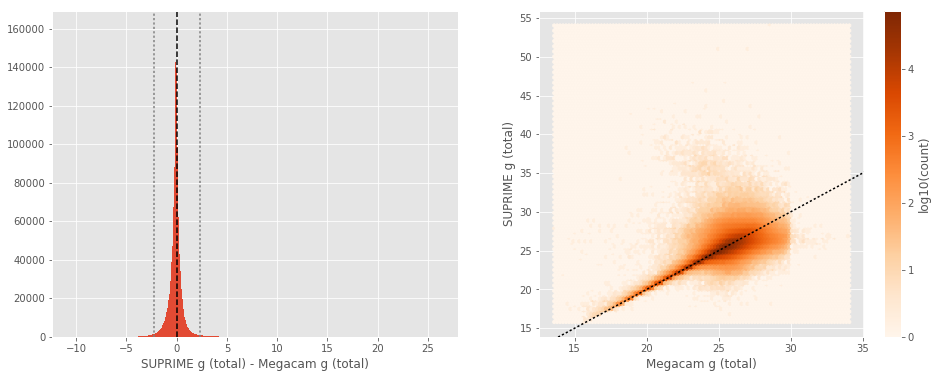

GPC1 g (aperture) - Megacam g (aperture):
- Median: -0.26
- Median Absolute Deviation: 0.32
- 1% percentile: -2.923695011138916
- 99% percentile: 2.1538532829284662


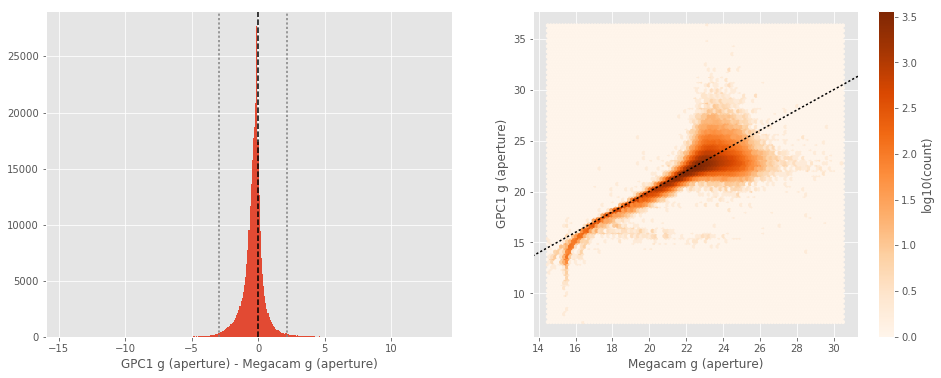

GPC1 g (total) - Megacam g (total):
- Median: 0.01
- Median Absolute Deviation: 0.26
- 1% percentile: -3.0604218292236327
- 99% percentile: 1.7563431167602528


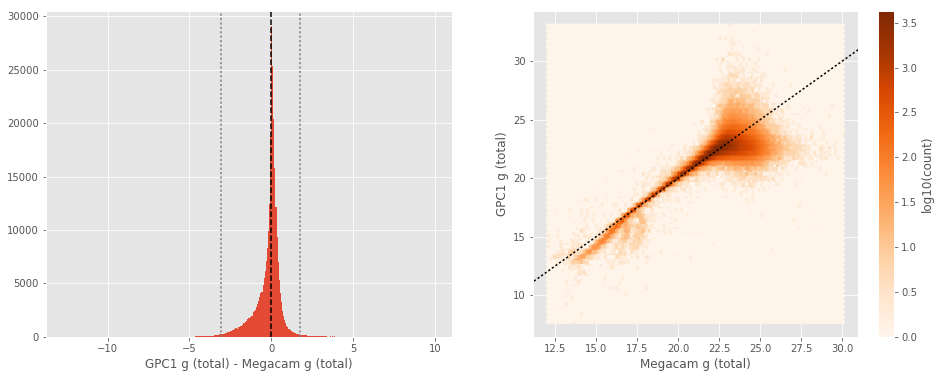

DECam g (aperture) - Megacam g (aperture):
- Median: -0.00
- Median Absolute Deviation: 0.18
- 1% percentile: -1.107715129852295
- 99% percentile: 1.7712550163269043


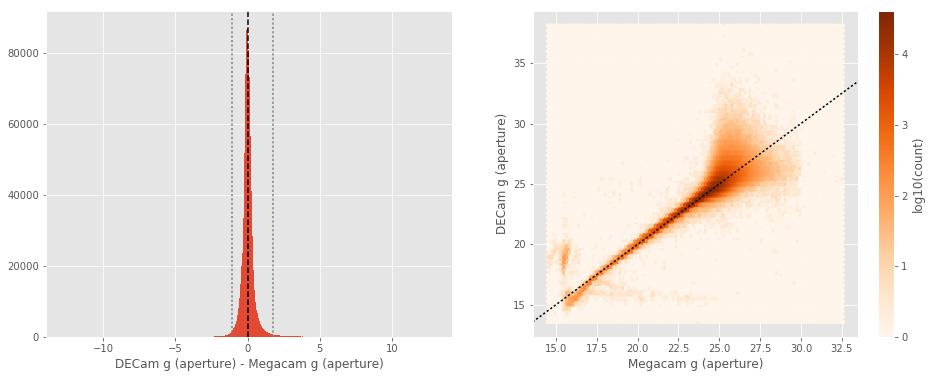

DECam g (total) - Megacam g (total):
- Median: 0.06
- Median Absolute Deviation: 0.19
- 1% percentile: -1.2402504920959472
- 99% percentile: 1.996587505340575


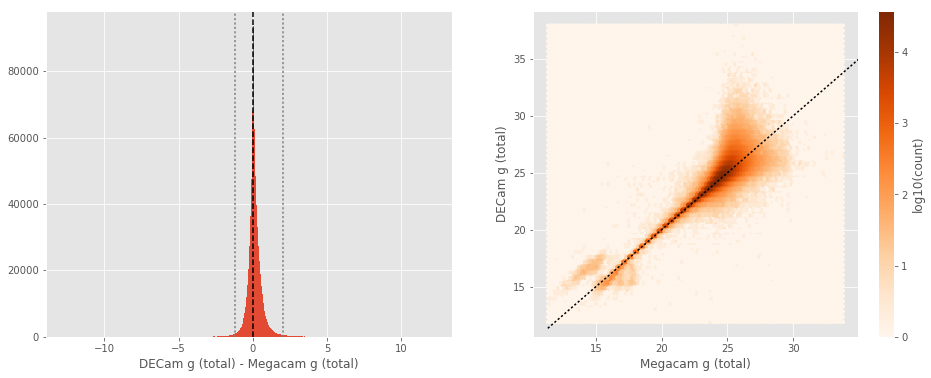

GPC1 g (aperture) - SUPRIME g (aperture):
- Median: -0.34
- Median Absolute Deviation: 0.40
- 1% percentile: -3.6355240631103514
- 99% percentile: 2.1407448959350557


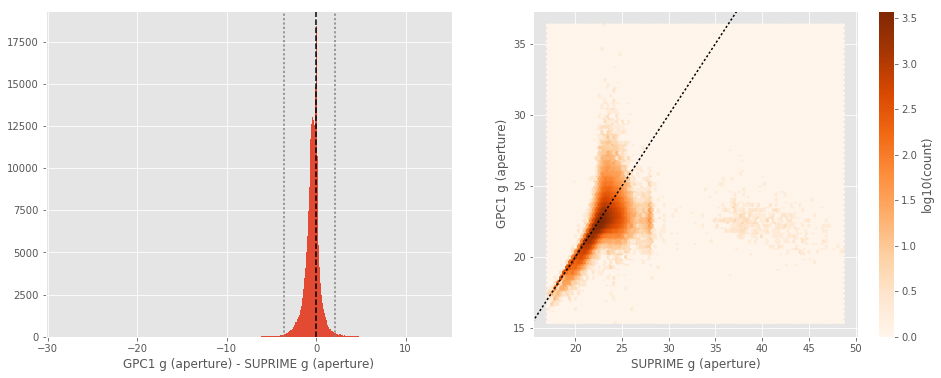

GPC1 g (total) - SUPRIME g (total):
- Median: 0.01
- Median Absolute Deviation: 0.28
- 1% percentile: -3.7431604385375974
- 99% percentile: 1.7456127166748274


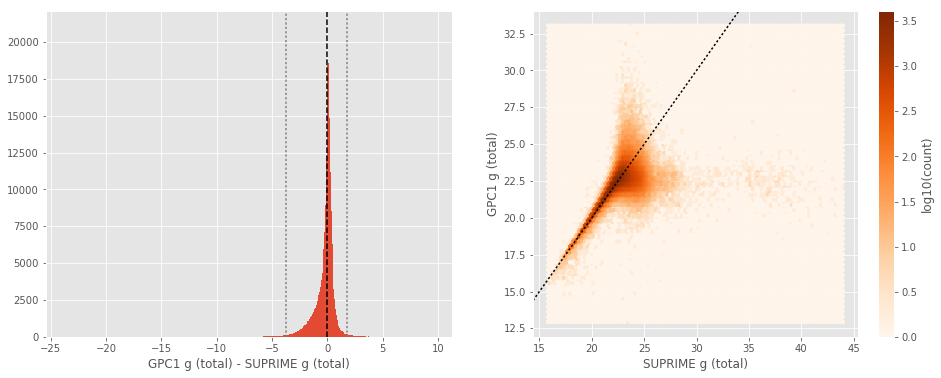

DECam g (aperture) - SUPRIME g (aperture):
- Median: -0.01
- Median Absolute Deviation: 0.15
- 1% percentile: -2.38048599243164
- 99% percentile: 1.7926739501953115


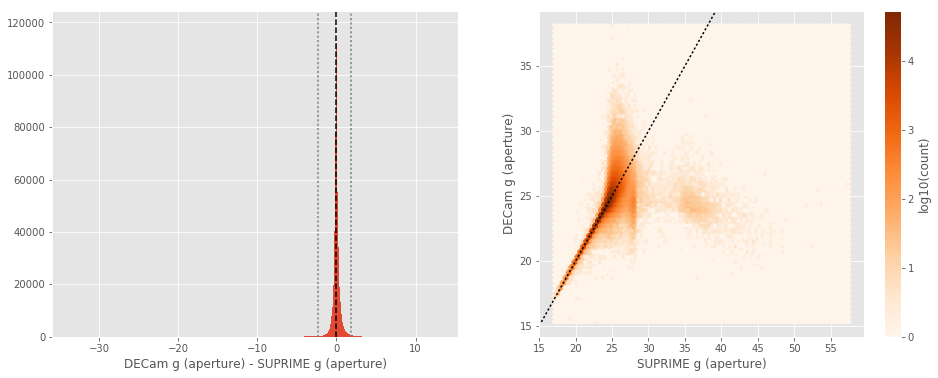

DECam g (total) - SUPRIME g (total):
- Median: 0.13
- Median Absolute Deviation: 0.22
- 1% percentile: -2.4151158905029297
- 99% percentile: 2.1798719024658197


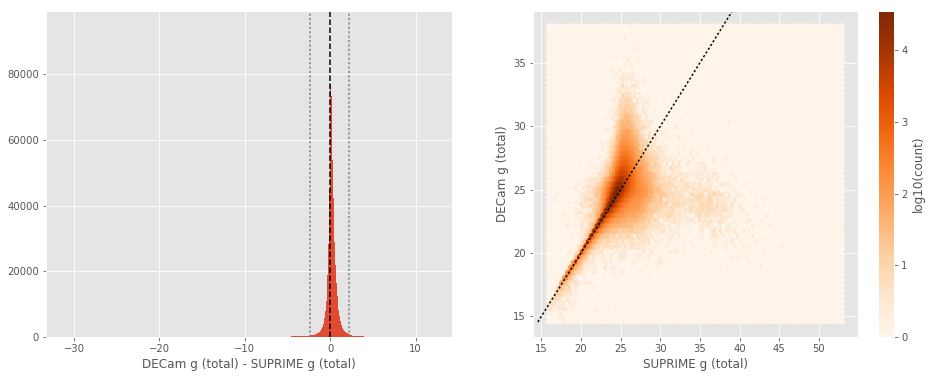

DECam g (aperture) - GPC1 g (aperture):
- Median: 0.31
- Median Absolute Deviation: 0.40
- 1% percentile: -2.204970932006836
- 99% percentile: 3.40045722961426


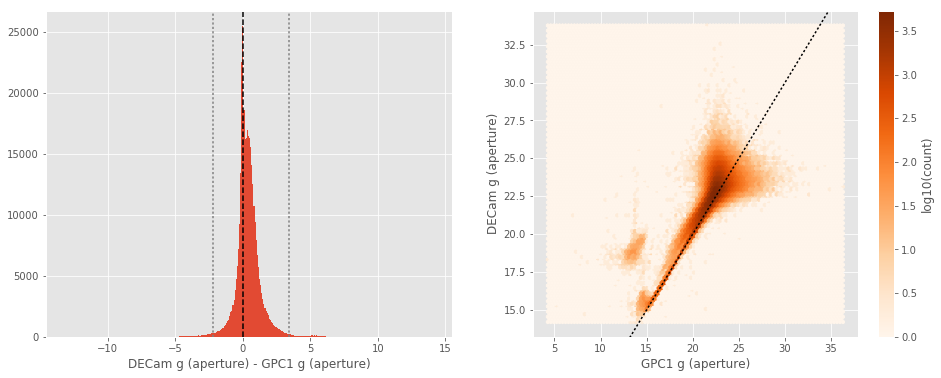

DECam g (total) - GPC1 g (total):
- Median: 0.00
- Median Absolute Deviation: 0.25
- 1% percentile: -1.7627799224853515
- 99% percentile: 3.3172676658630387


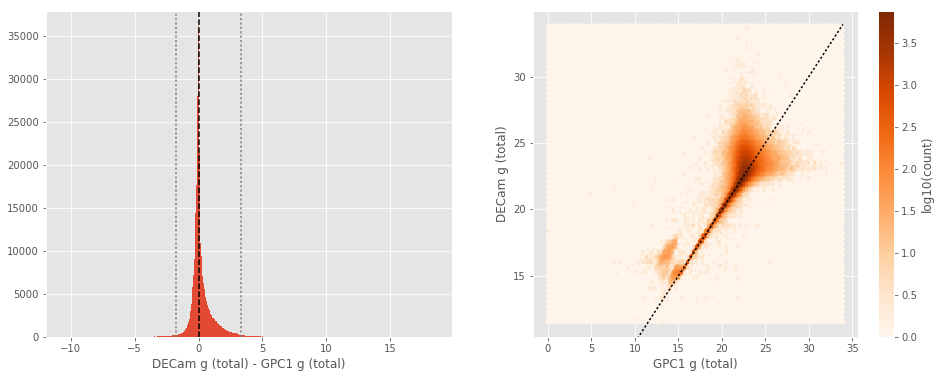

SUPRIME r (aperture) - Megacam r (aperture):
- Median: -0.07
- Median Absolute Deviation: 0.19
- 1% percentile: -1.741839771270752
- 99% percentile: 1.9862741279602076


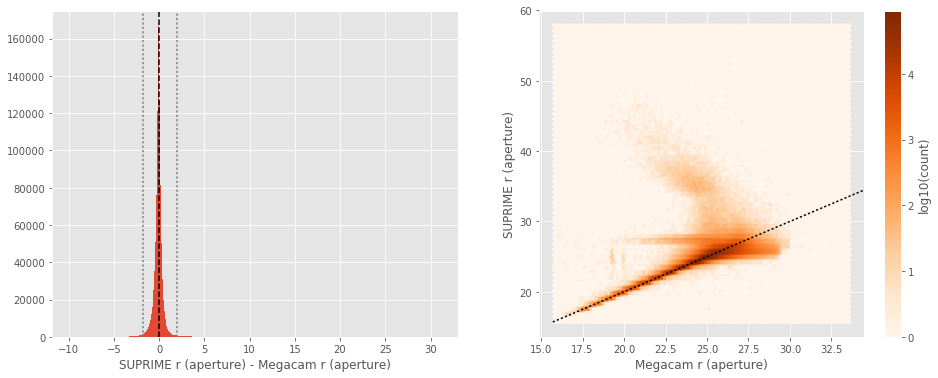

SUPRIME r (total) - Megacam r (total):
- Median: -0.11
- Median Absolute Deviation: 0.25
- 1% percentile: -2.4686038017272947
- 99% percentile: 2.417576599121091


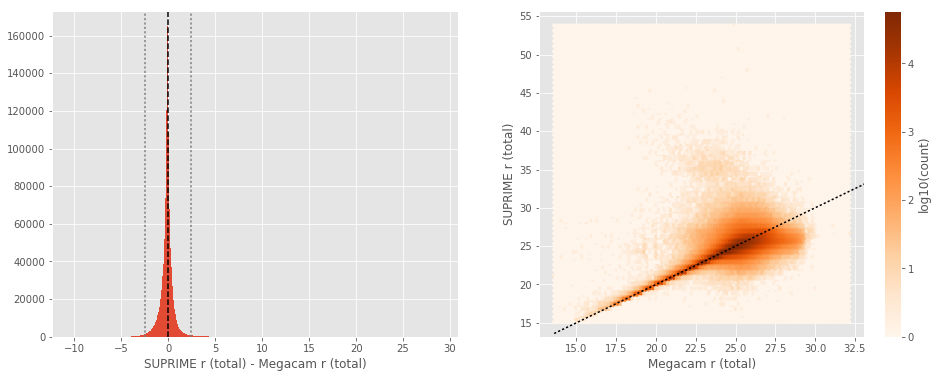

GPC1 r (aperture) - Megacam r (aperture):
- Median: -0.18
- Median Absolute Deviation: 0.20
- 1% percentile: -1.6846182918548585
- 99% percentile: 1.524917507171636


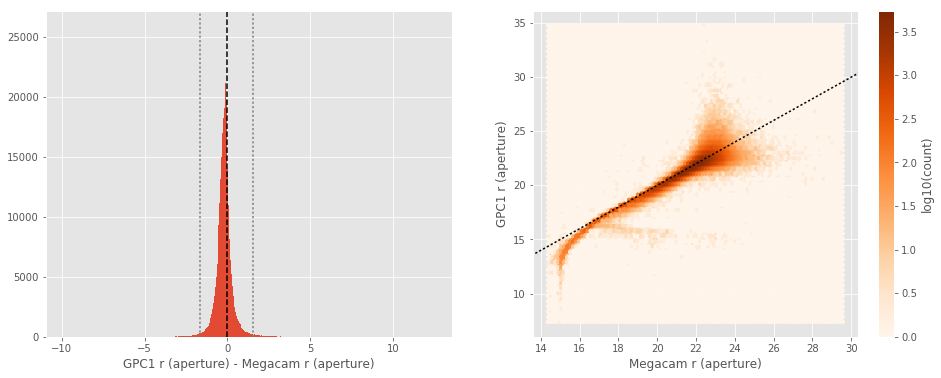

GPC1 r (total) - Megacam r (total):
- Median: 0.06
- Median Absolute Deviation: 0.14
- 1% percentile: -1.698433837890625
- 99% percentile: 1.1222000122070312


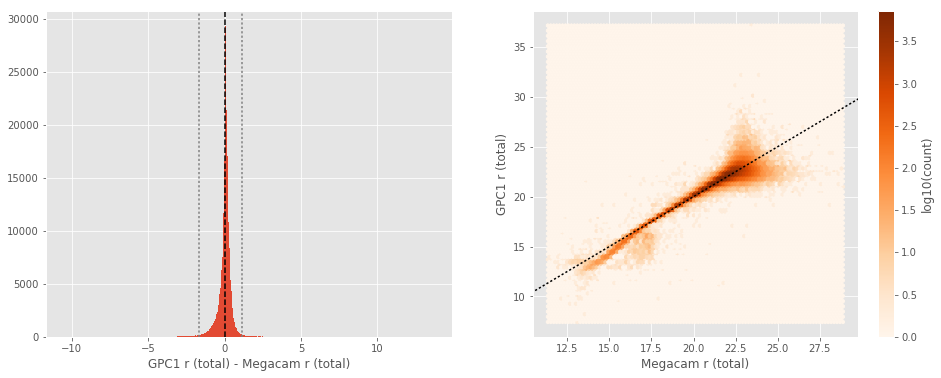

DECam r (aperture) - Megacam r (aperture):
- Median: -0.09
- Median Absolute Deviation: 0.17
- 1% percentile: -1.0815669631958007
- 99% percentile: 1.9723520851135259


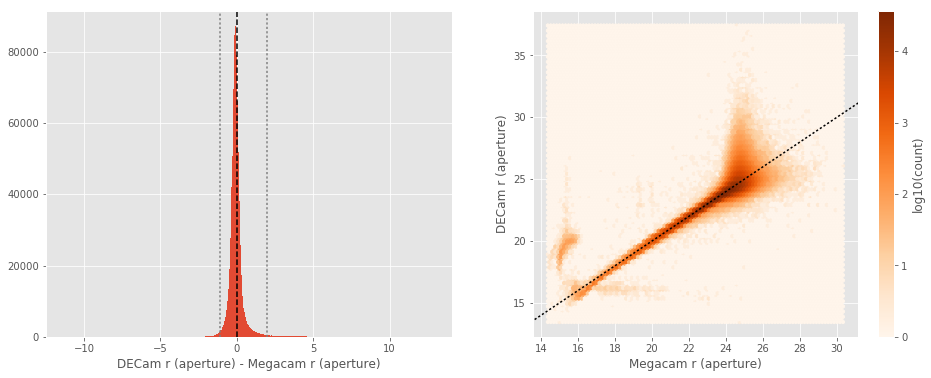

DECam r (total) - Megacam r (total):
- Median: -0.07
- Median Absolute Deviation: 0.18
- 1% percentile: -1.1824758529663084
- 99% percentile: 1.3057351684570353


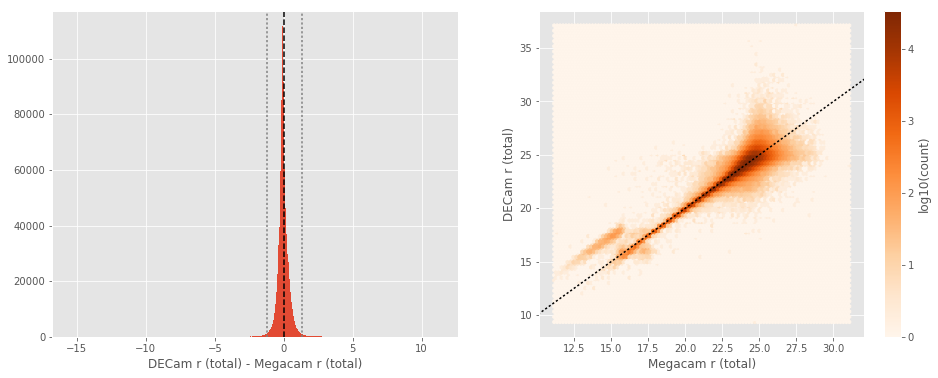

GPC1 r (aperture) - SUPRIME r (aperture):
- Median: -0.18
- Median Absolute Deviation: 0.27
- 1% percentile: -2.6781114959716796
- 99% percentile: 1.5765098571777345


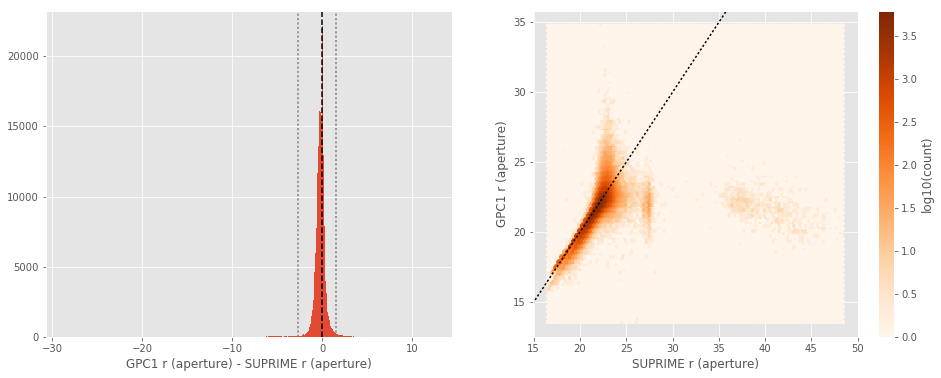

GPC1 r (total) - SUPRIME r (total):
- Median: 0.12
- Median Absolute Deviation: 0.16
- 1% percentile: -2.7883457565307617
- 99% percentile: 1.156285095214844


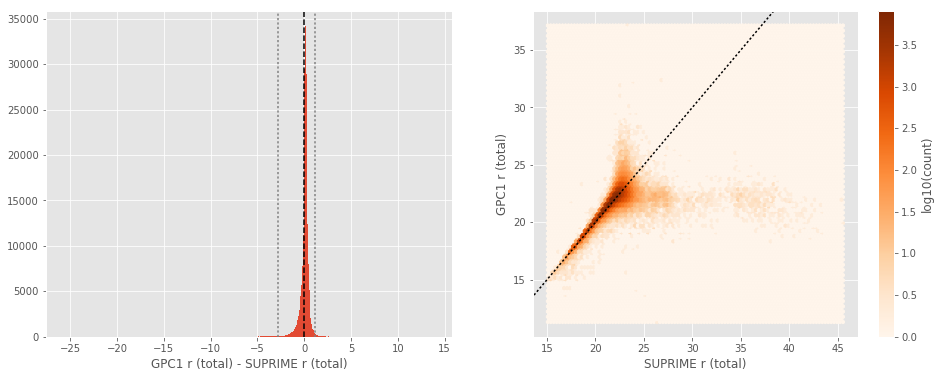

DECam r (aperture) - SUPRIME r (aperture):
- Median: -0.04
- Median Absolute Deviation: 0.14
- 1% percentile: -2.5140983963012697
- 99% percentile: 2.0019435119628906


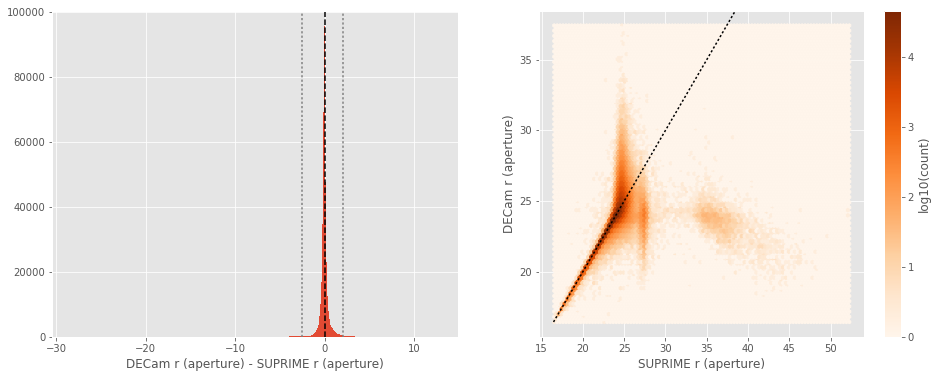

DECam r (total) - SUPRIME r (total):
- Median: 0.03
- Median Absolute Deviation: 0.20
- 1% percentile: -2.5913173675537107
- 99% percentile: 1.527161788940429


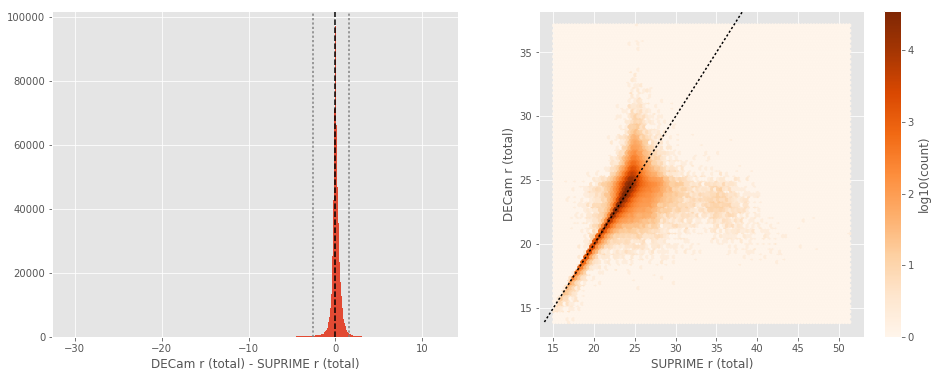

DECam r (aperture) - GPC1 r (aperture):
- Median: 0.10
- Median Absolute Deviation: 0.28
- 1% percentile: -1.6749701309204101
- 99% percentile: 3.6438082408905066


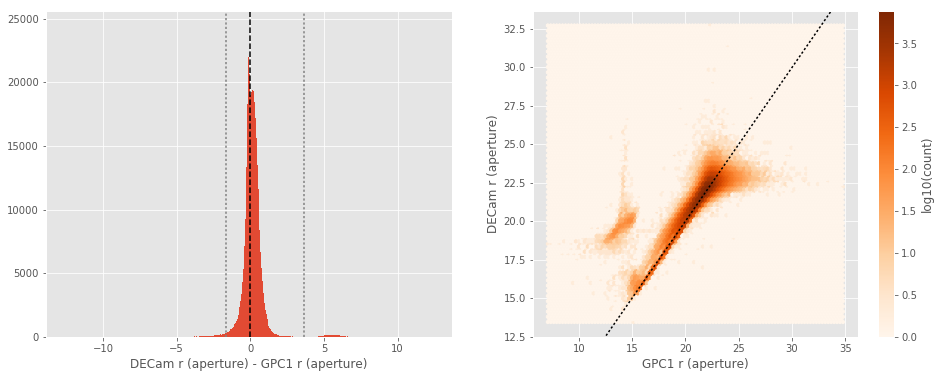

DECam r (total) - GPC1 r (total):
- Median: -0.17
- Median Absolute Deviation: 0.14
- 1% percentile: -1.259248275756836
- 99% percentile: 2.631193618774417


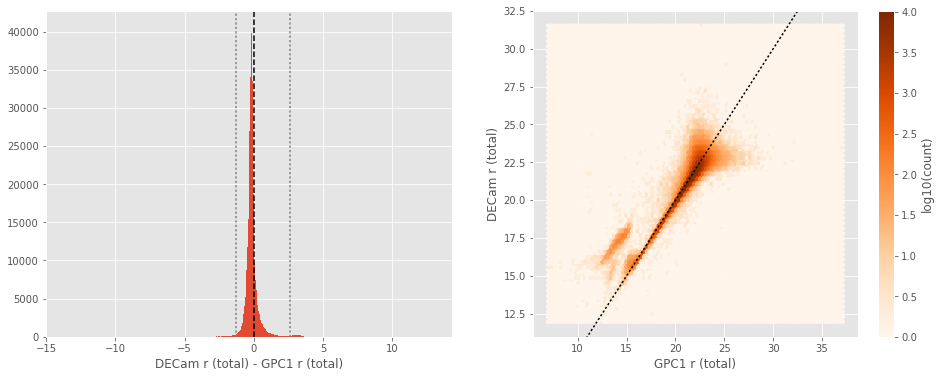

SUPRIME i (aperture) - Megacam i (aperture):
- Median: -0.01
- Median Absolute Deviation: 0.20
- 1% percentile: -1.9167156982421876
- 99% percentile: 2.5837923431396455


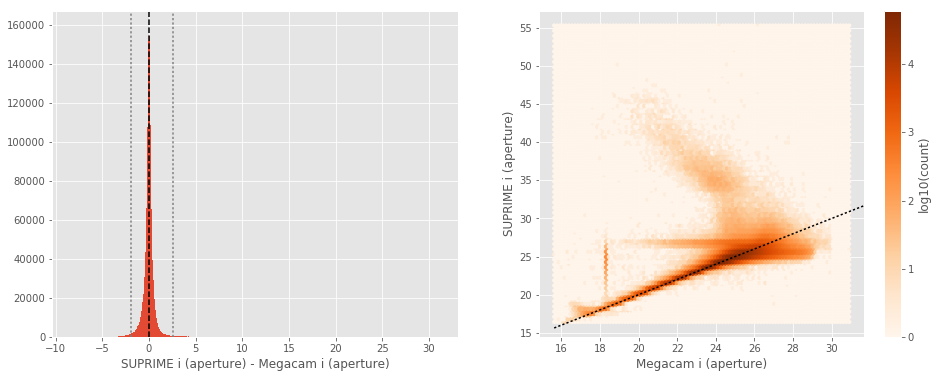

SUPRIME i (total) - Megacam i (total):
- Median: -0.10
- Median Absolute Deviation: 0.27
- 1% percentile: -2.636057662963867
- 99% percentile: 3.0795284271240213


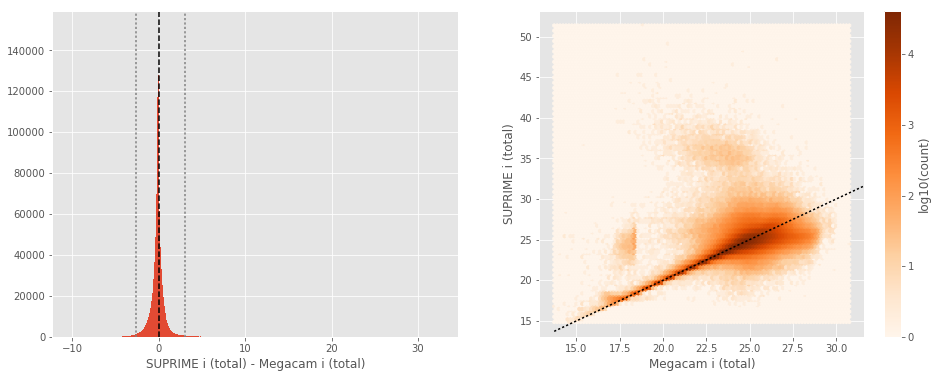

GPC1 i (aperture) - Megacam i (aperture):
- Median: -0.09
- Median Absolute Deviation: 0.12
- 1% percentile: -1.1014163970947266
- 99% percentile: 0.6853575515747057


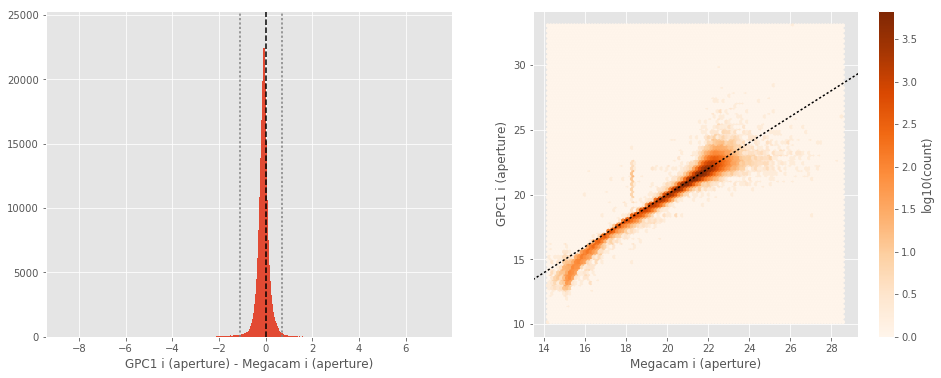

GPC1 i (total) - Megacam i (total):
- Median: 0.12
- Median Absolute Deviation: 0.10
- 1% percentile: -0.8628997802734375
- 99% percentile: 0.7098175811767562


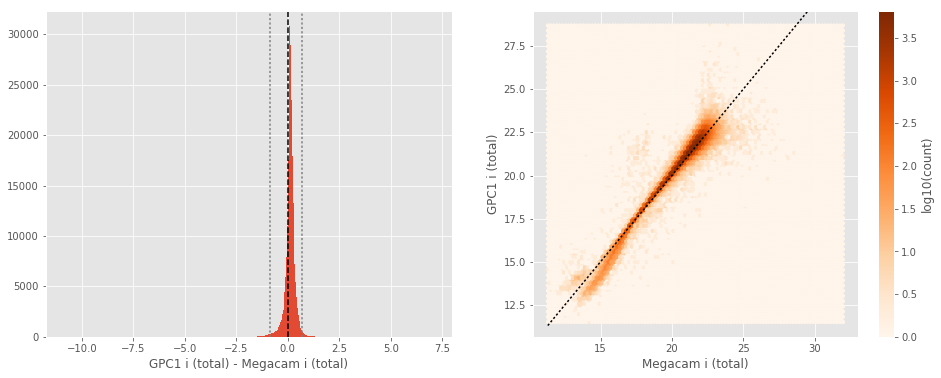

DECam i (aperture) - Megacam i (aperture):
- Median: 0.00
- Median Absolute Deviation: 0.14
- 1% percentile: -0.6786011123657226
- 99% percentile: 0.7076372909545956


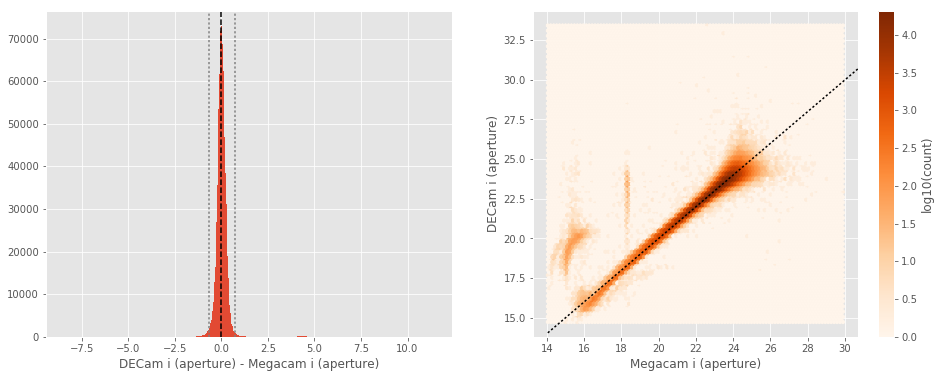

DECam i (total) - Megacam i (total):
- Median: -0.03
- Median Absolute Deviation: 0.14
- 1% percentile: -0.9132747650146484
- 99% percentile: 1.1931896209716797


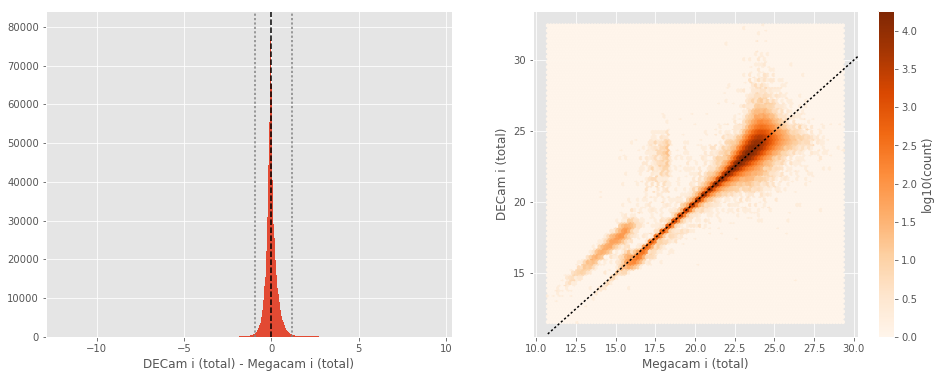

GPC1 i (aperture) - SUPRIME i (aperture):
- Median: -0.13
- Median Absolute Deviation: 0.20
- 1% percentile: -4.7828536796569825
- 99% percentile: 0.6963841056823731


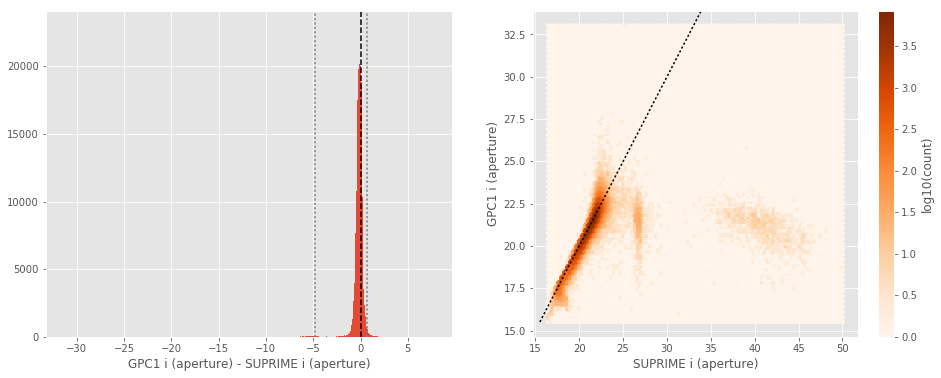

GPC1 i (total) - SUPRIME i (total):
- Median: 0.19
- Median Absolute Deviation: 0.11
- 1% percentile: -4.401985321044922
- 99% percentile: 0.7501154327392573


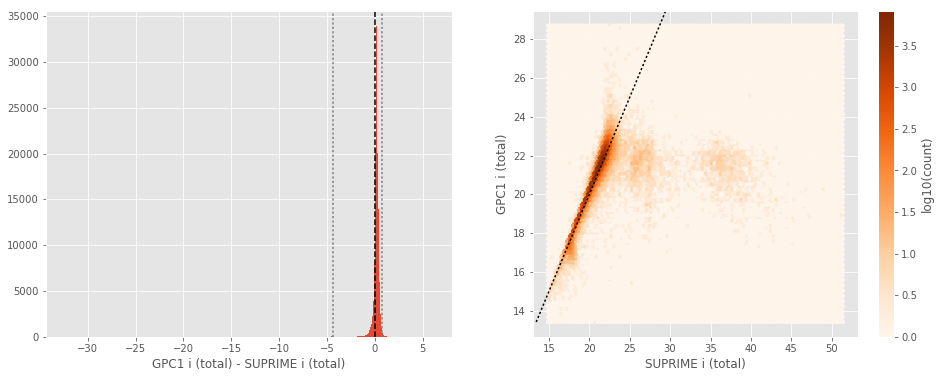

DECam i (aperture) - SUPRIME i (aperture):
- Median: -0.02
- Median Absolute Deviation: 0.09
- 1% percentile: -3.423588180541992
- 99% percentile: 0.6003108978271494


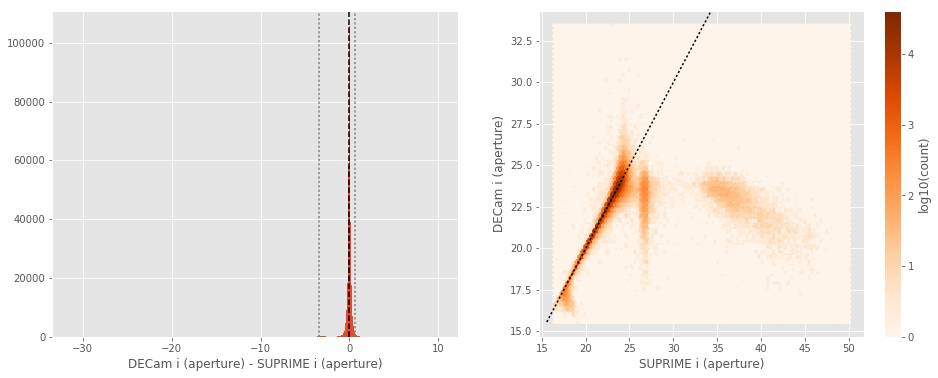

DECam i (total) - SUPRIME i (total):
- Median: 0.06
- Median Absolute Deviation: 0.15
- 1% percentile: -3.5717692375183105
- 99% percentile: 1.1974482536315918


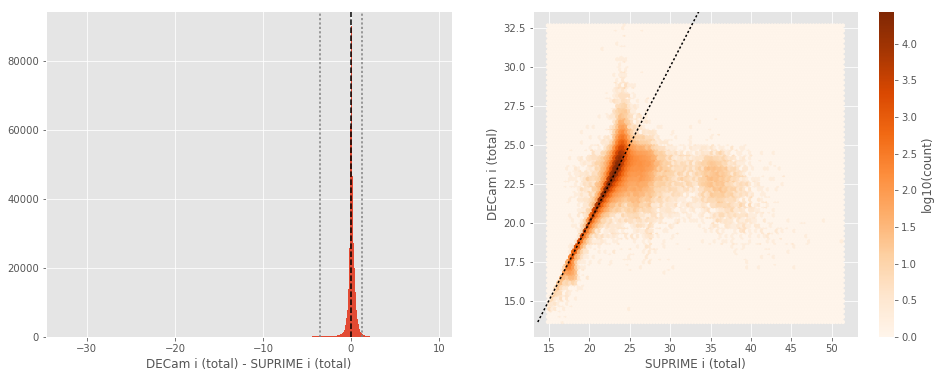

DECam i (aperture) - GPC1 i (aperture):
- Median: 0.10
- Median Absolute Deviation: 0.21
- 1% percentile: -0.7455041885375977
- 99% percentile: 5.089320182800294


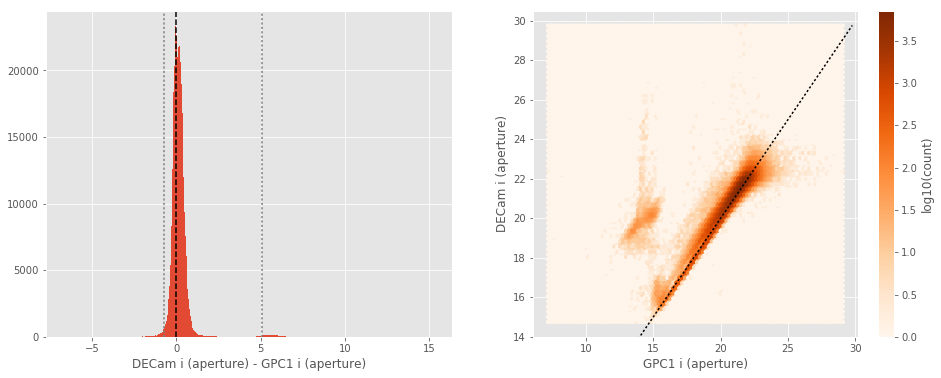

DECam i (total) - GPC1 i (total):
- Median: -0.17
- Median Absolute Deviation: 0.10
- 1% percentile: -0.771400260925293
- 99% percentile: 2.869143295288107


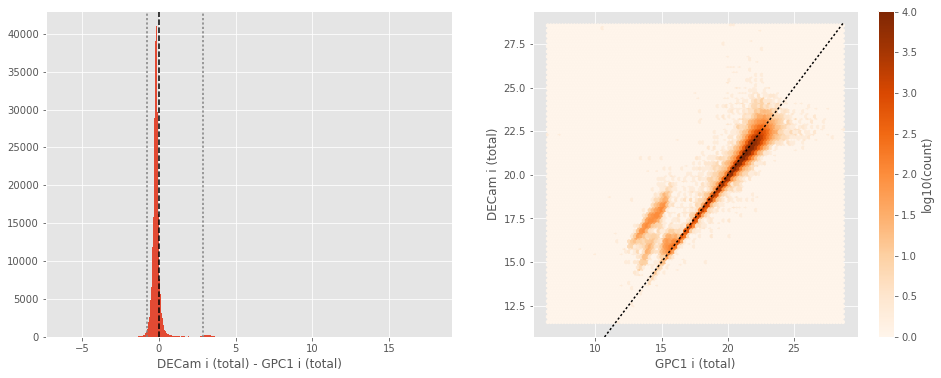

SUPRIME z (aperture) - Megacam z (aperture):
- Median: -0.02
- Median Absolute Deviation: 0.32
- 1% percentile: -2.447485733032227
- 99% percentile: 3.3047220611572143


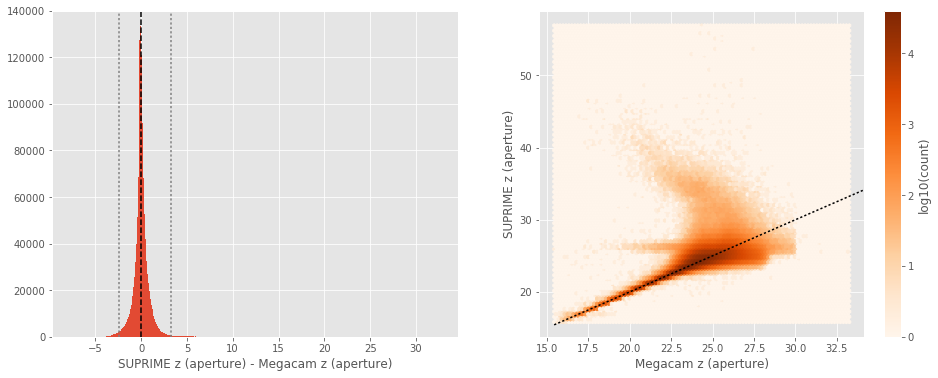

SUPRIME z (total) - Megacam z (total):
- Median: -0.07
- Median Absolute Deviation: 0.42
- 1% percentile: -2.9348392486572266
- 99% percentile: 3.2758159637450888


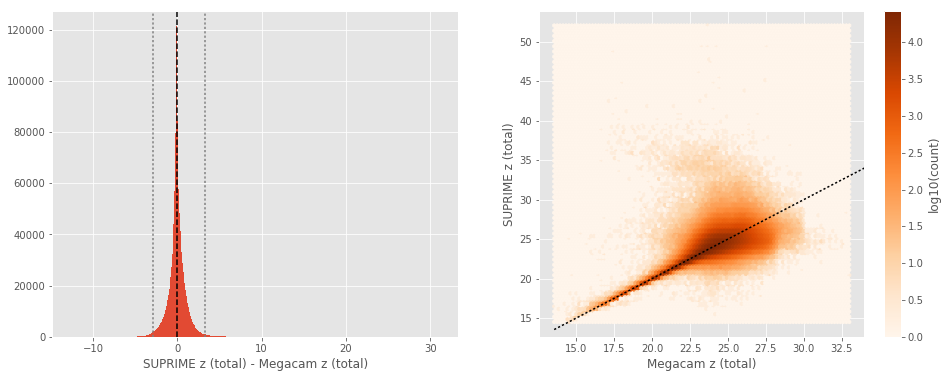

GPC1 z (aperture) - Megacam z (aperture):
- Median: -0.13
- Median Absolute Deviation: 0.14
- 1% percentile: -1.229004096984863
- 99% percentile: 0.9082548332214402


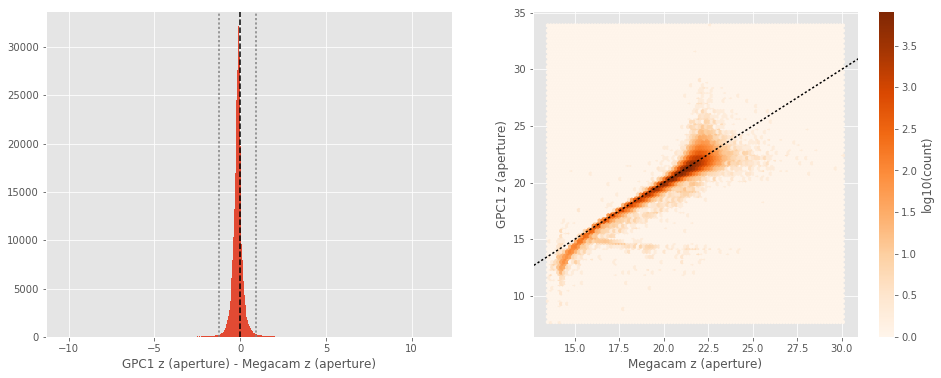

GPC1 z (total) - Megacam z (total):
- Median: 0.10
- Median Absolute Deviation: 0.12
- 1% percentile: -1.0418992614746094
- 99% percentile: 0.8804988861083984


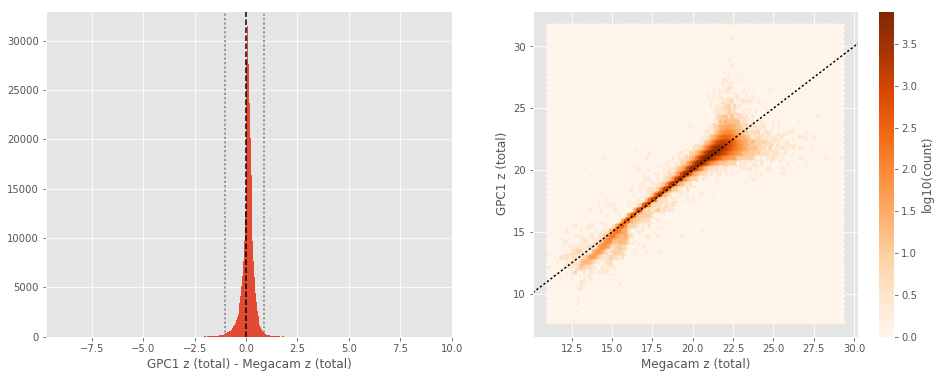

DECam z (aperture) - Megacam z (aperture):
- Median: -0.09
- Median Absolute Deviation: 0.22
- 1% percentile: -2.2596270751953123
- 99% percentile: 2.2798955154418707


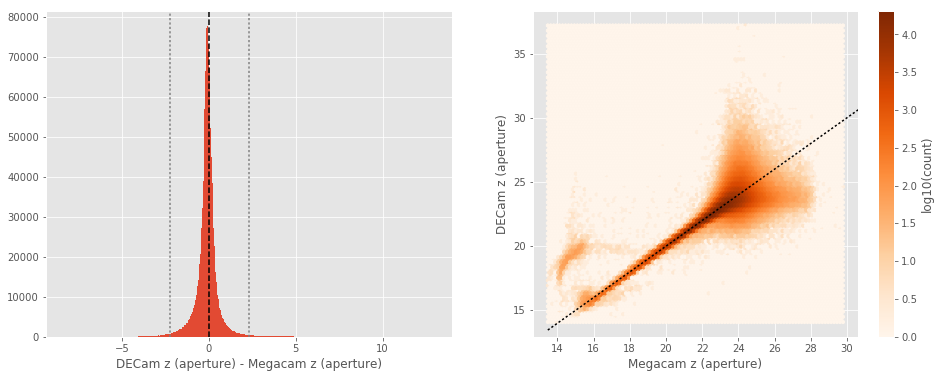

DECam z (total) - Megacam z (total):
- Median: -0.06
- Median Absolute Deviation: 0.27
- 1% percentile: -2.336577758789062
- 99% percentile: 2.3574640655517594


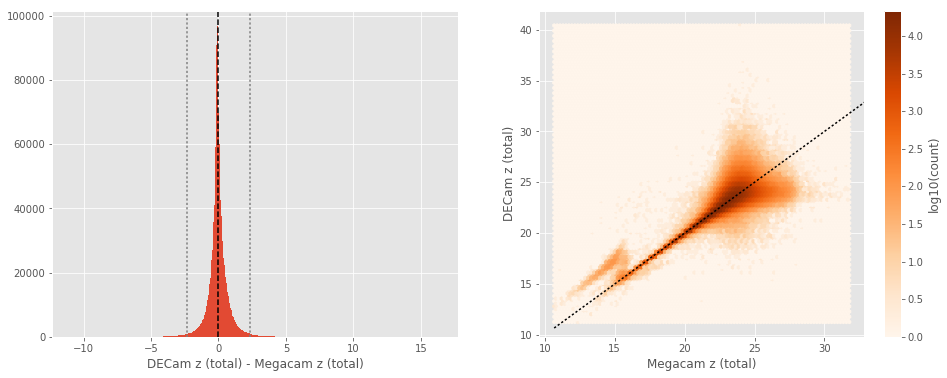

VISTA Z (aperture) - Megacam z (aperture):
- Median: 0.03
- Median Absolute Deviation: 0.23
- 1% percentile: -2.3203365325927736
- 99% percentile: 5.049309539794924


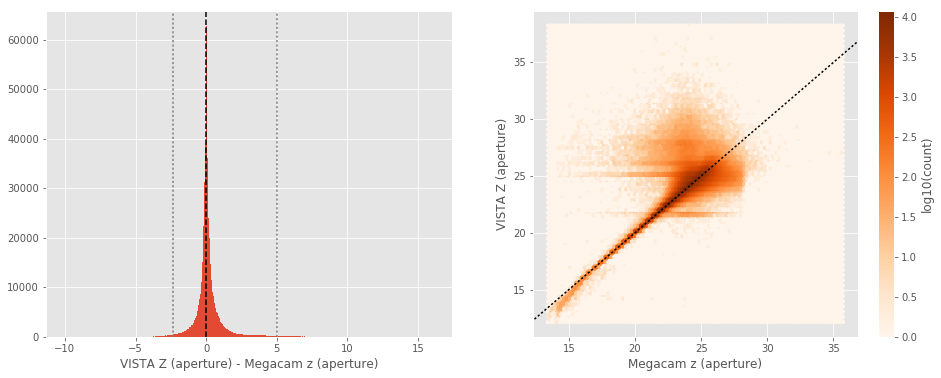

VISTA Z (total) - Megacam z (total):
- Median: 0.09
- Median Absolute Deviation: 0.33
- 1% percentile: -2.2616295623779297
- 99% percentile: 5.118752098083502


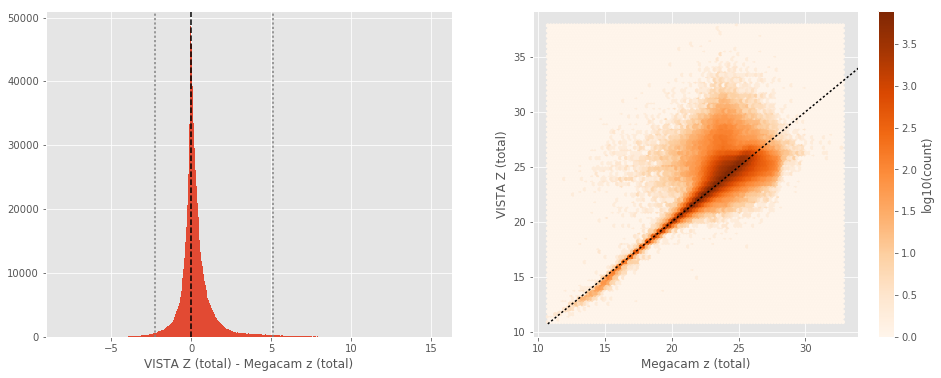

GPC1 z (aperture) - SUPRIME z (aperture):
- Median: -0.09
- Median Absolute Deviation: 0.20
- 1% percentile: -2.5357738494873048
- 99% percentile: 0.9684913253784179


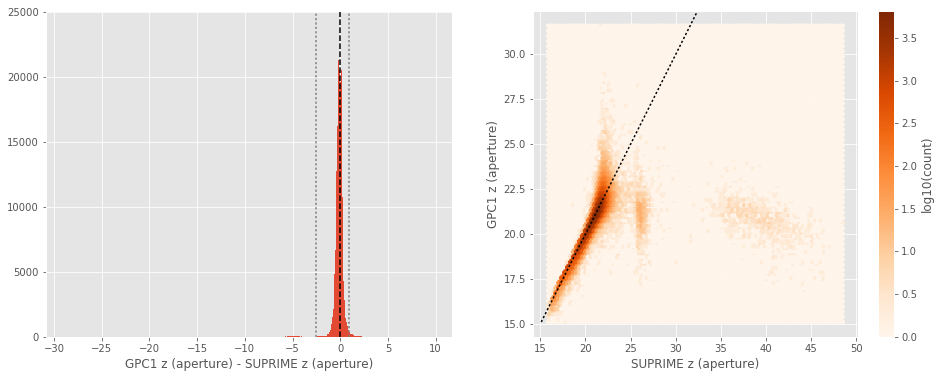

GPC1 z (total) - SUPRIME z (total):
- Median: 0.19
- Median Absolute Deviation: 0.13
- 1% percentile: -2.3870449638366704
- 99% percentile: 0.9100053024291974


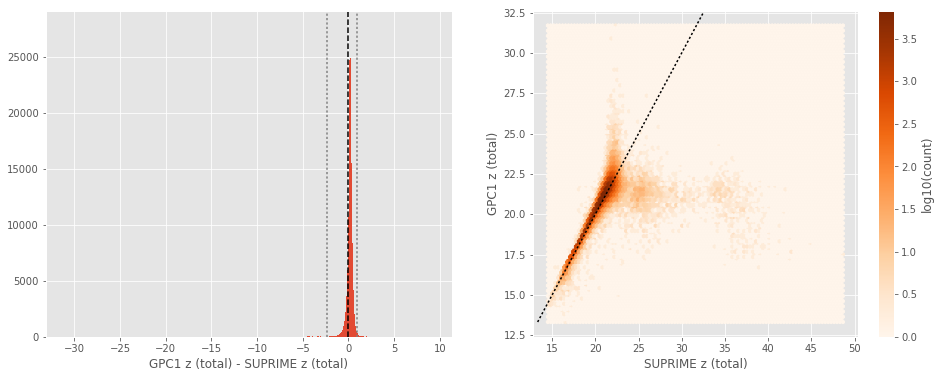

DECam z (aperture) - SUPRIME z (aperture):
- Median: -0.03
- Median Absolute Deviation: 0.16
- 1% percentile: -3.121656150817871
- 99% percentile: 2.133588409423824


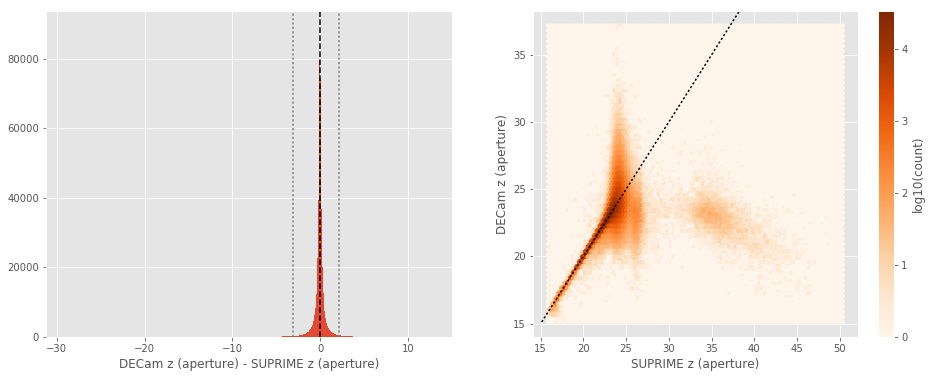

DECam z (total) - SUPRIME z (total):
- Median: 0.05
- Median Absolute Deviation: 0.24
- 1% percentile: -2.77428596496582
- 99% percentile: 2.375800323486325


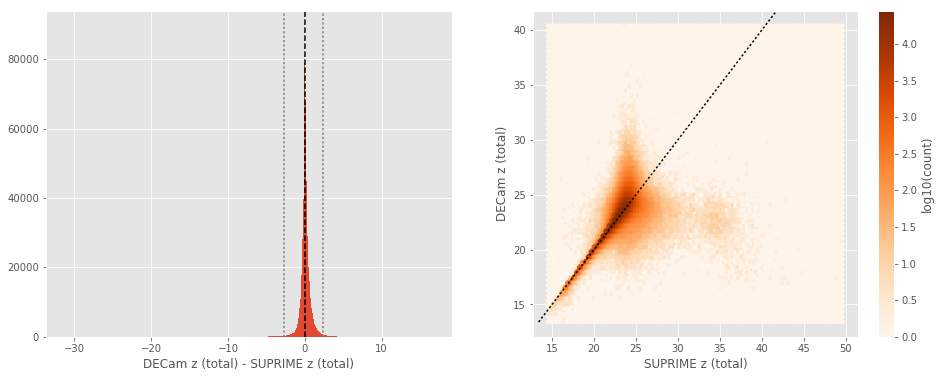

VISTA Z (aperture) - SUPRIME z (aperture):
- Median: 0.06
- Median Absolute Deviation: 0.18
- 1% percentile: -2.592559814453125
- 99% percentile: 4.79986572265625


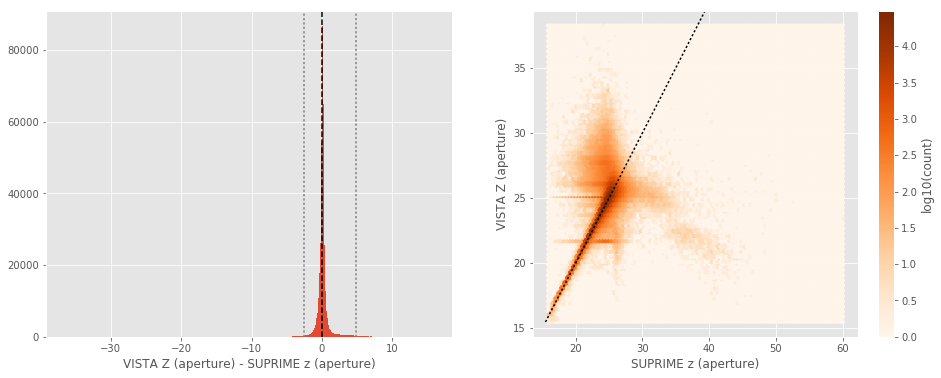

VISTA Z (total) - SUPRIME z (total):
- Median: 0.15
- Median Absolute Deviation: 0.29
- 1% percentile: -2.666861820220947
- 99% percentile: 5.025450191497788


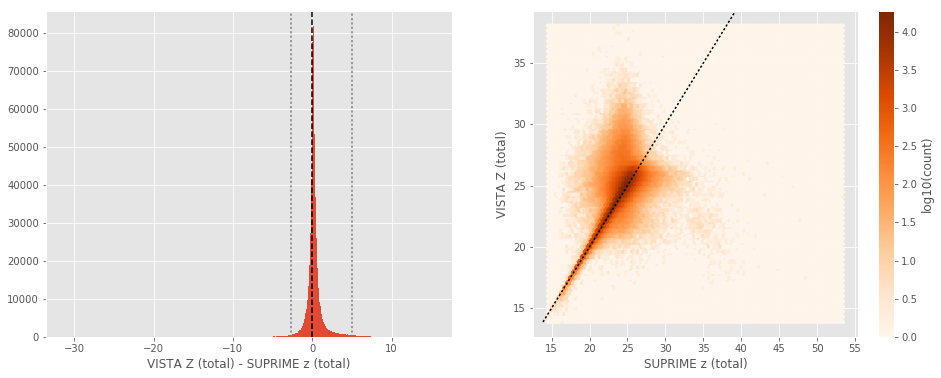

DECam z (aperture) - GPC1 z (aperture):
- Median: 0.08
- Median Absolute Deviation: 0.21
- 1% percentile: -1.0201219749450683
- 99% percentile: 5.041556749343871


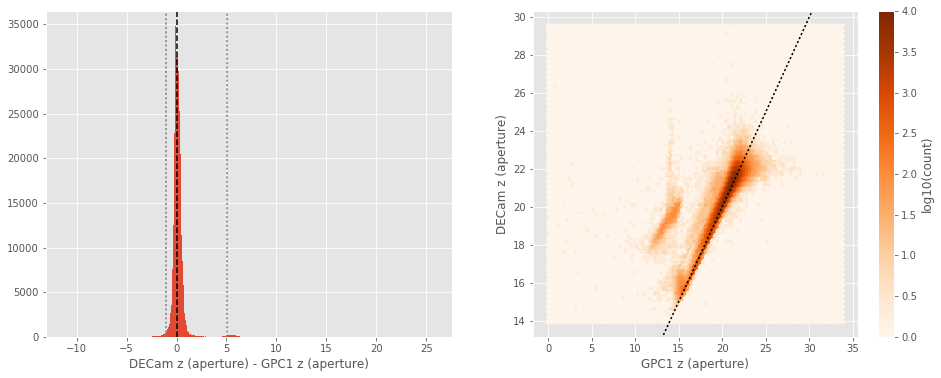

DECam z (total) - GPC1 z (total):
- Median: -0.18
- Median Absolute Deviation: 0.12
- 1% percentile: -0.9738799285888672
- 99% percentile: 2.6826425075530977


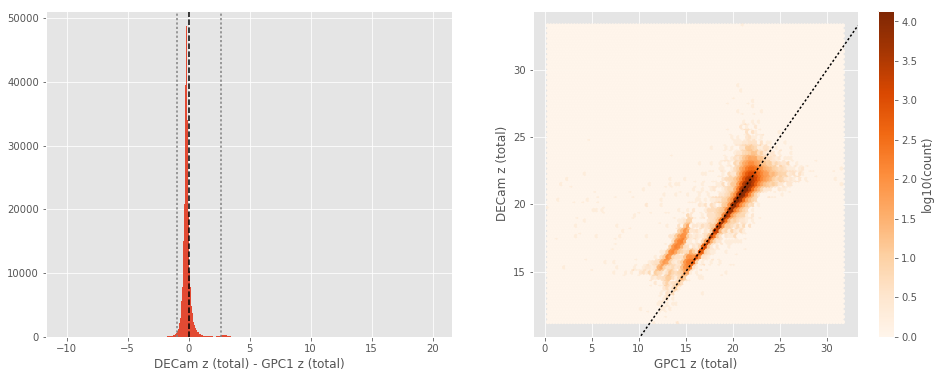

VISTA Z (aperture) - GPC1 z (aperture):
- Median: 0.14
- Median Absolute Deviation: 0.16
- 1% percentile: -0.8950440406799316
- 99% percentile: 7.7044631385803255


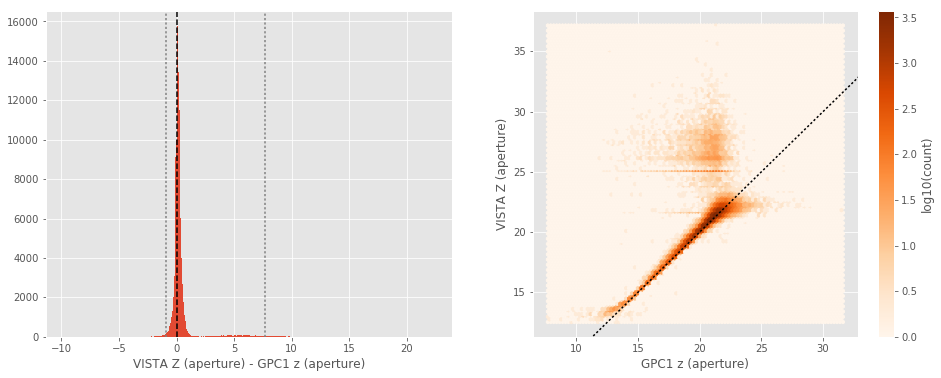

VISTA Z (total) - GPC1 z (total):
- Median: -0.13
- Median Absolute Deviation: 0.14
- 1% percentile: -0.9852363395690917
- 99% percentile: 6.875684700012207


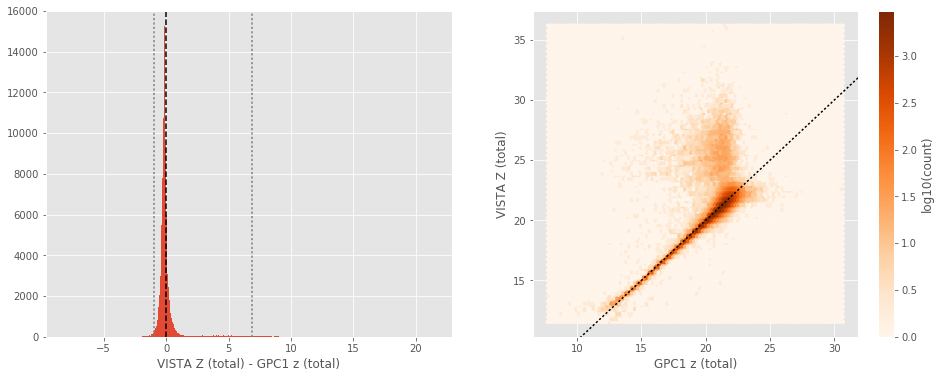

VISTA Z (aperture) - DECam z (aperture):
- Median: 0.09
- Median Absolute Deviation: 0.18
- 1% percentile: -2.39511360168457
- 99% percentile: 5.928247776031494


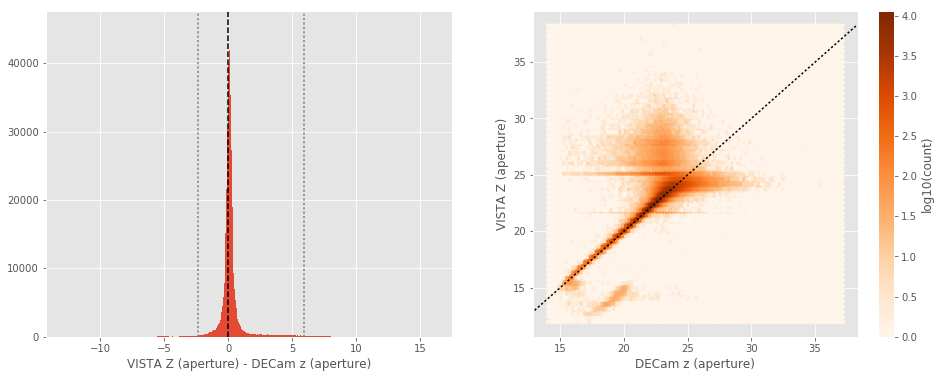

VISTA Z (total) - DECam z (total):
- Median: 0.06
- Median Absolute Deviation: 0.23
- 1% percentile: -2.1579328918457032
- 99% percentile: 5.653548698425289


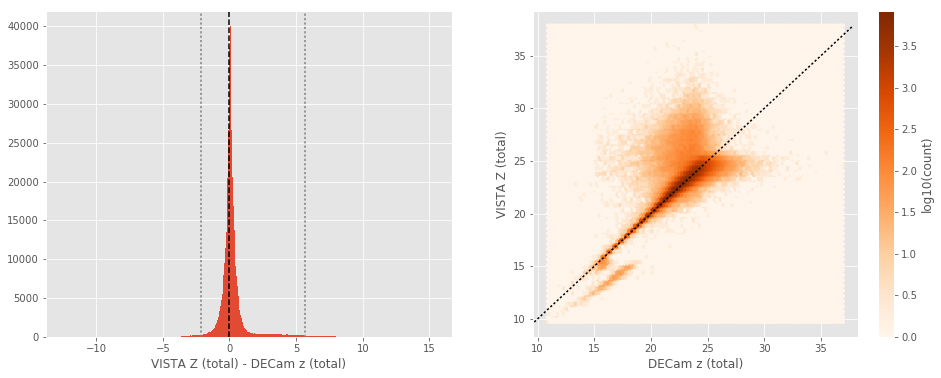

SUPRIME y (aperture) - Megacam y (aperture):
- Median: -0.44
- Median Absolute Deviation: 0.38
- 1% percentile: -2.362483768463135
- 99% percentile: 4.718506317138713


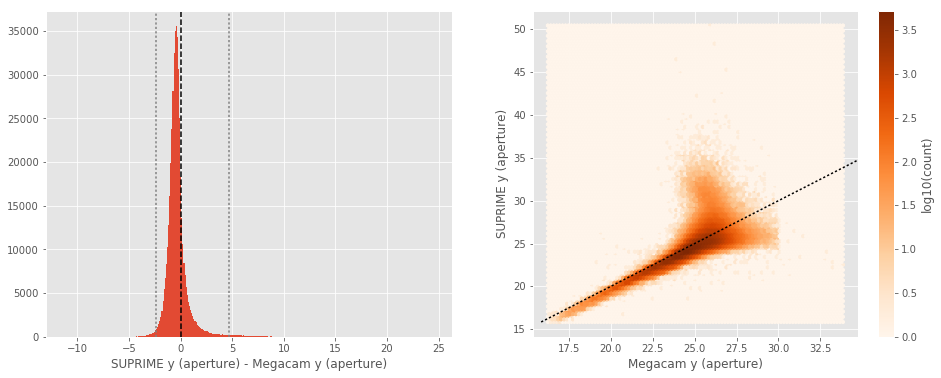

SUPRIME y (total) - Megacam y (total):
- Median: -0.51
- Median Absolute Deviation: 0.43
- 1% percentile: -3.4871426582336427
- 99% percentile: 2.9167009544372267


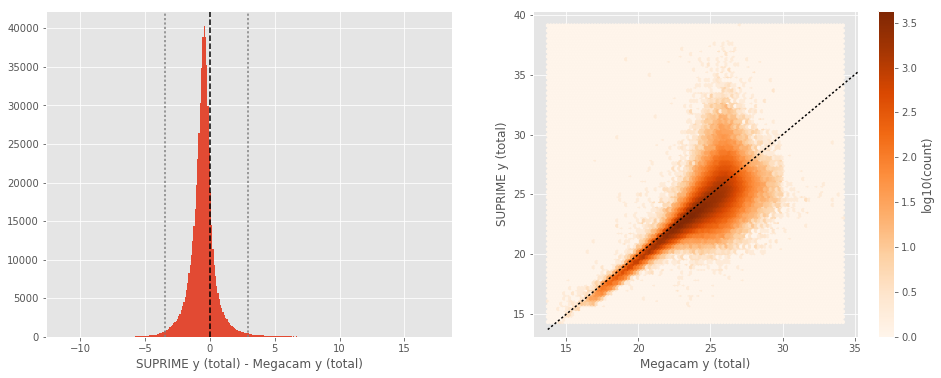

GPC1 y (aperture) - Megacam y (aperture):
- Median: -0.85
- Median Absolute Deviation: 0.33
- 1% percentile: -3.60290412902832
- 99% percentile: 1.2515487289428668


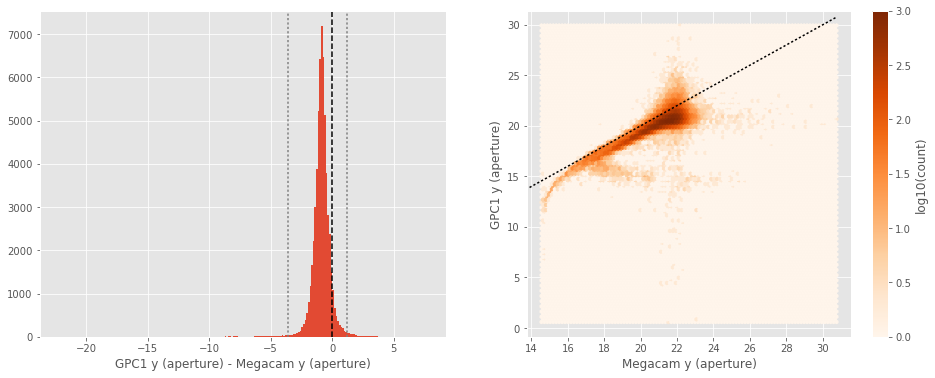

GPC1 y (total) - Megacam y (total):
- Median: -0.47
- Median Absolute Deviation: 0.38
- 1% percentile: -2.7168086242675784
- 99% percentile: 1.4016079711914065


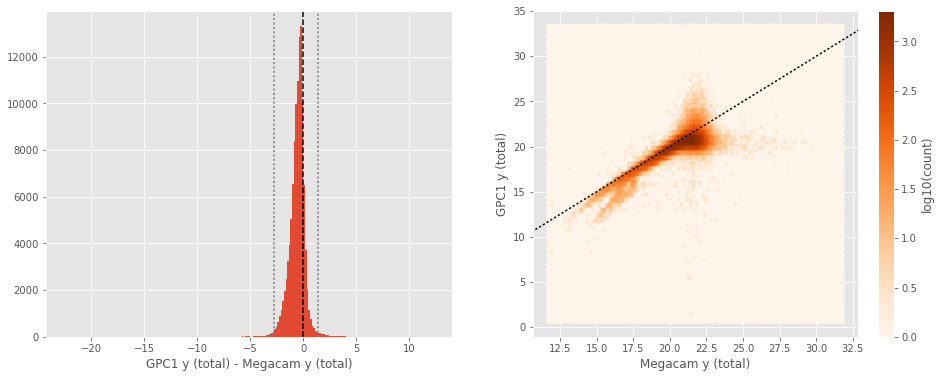

DECam y (aperture) - Megacam y (aperture):
- Median: -0.45
- Median Absolute Deviation: 0.38
- 1% percentile: -2.0142159271240234
- 99% percentile: 2.4878184509277337


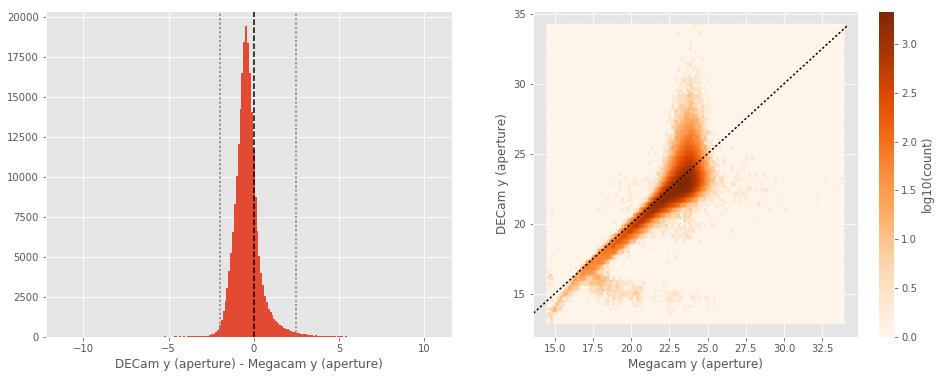

DECam y (total) - Megacam y (total):
- Median: -0.43
- Median Absolute Deviation: 0.42
- 1% percentile: -2.306287536621094
- 99% percentile: 2.8485866546630865


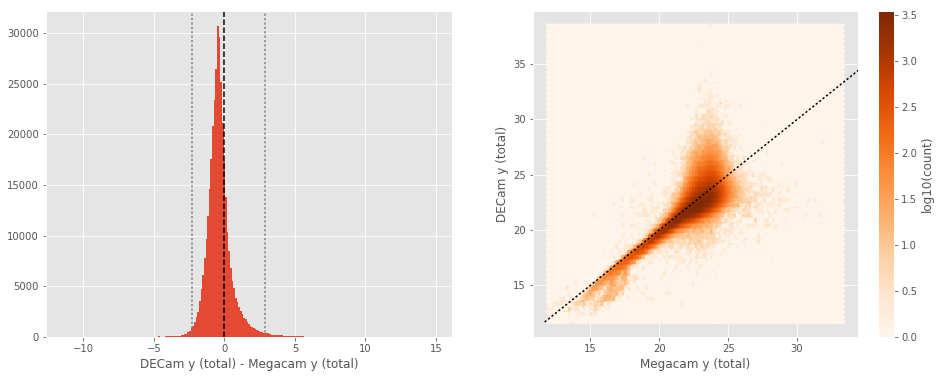

VISTA Y (aperture) - Megacam y (aperture):
- Median: -0.39
- Median Absolute Deviation: 0.30
- 1% percentile: -1.8950813293457032
- 99% percentile: 1.2401432037353475


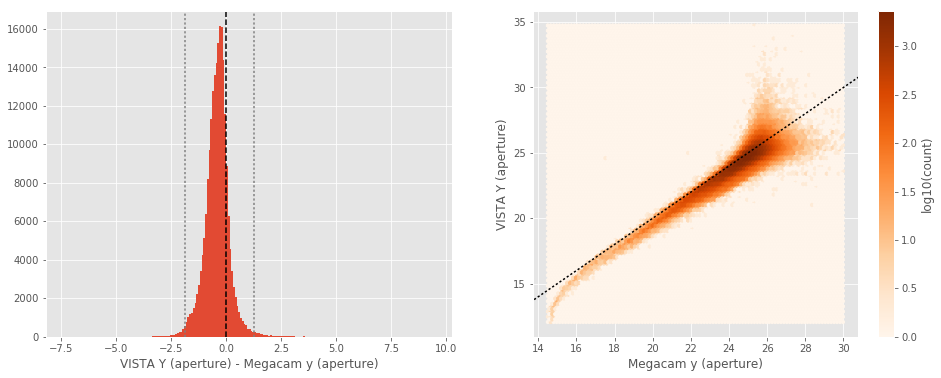

VISTA Y (total) - Megacam y (total):
- Median: -0.33
- Median Absolute Deviation: 0.33
- 1% percentile: -1.9636022949218748
- 99% percentile: 1.0820082664489747


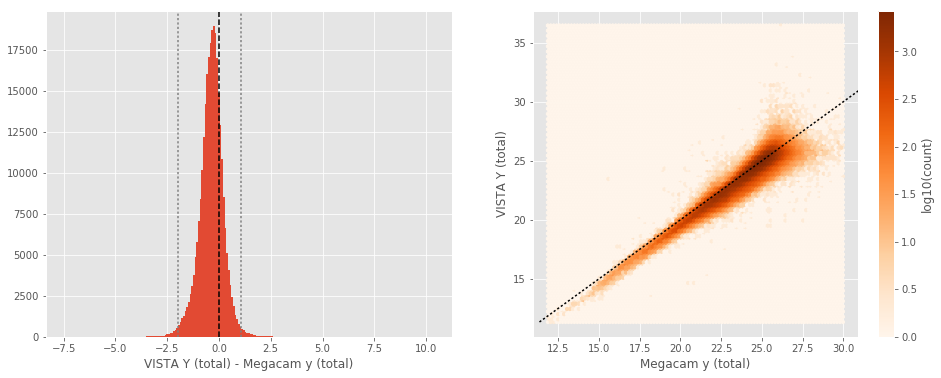

GPC1 y (aperture) - SUPRIME y (aperture):
- Median: -0.29
- Median Absolute Deviation: 0.32
- 1% percentile: -2.0775110626220705
- 99% percentile: 1.6714744949340825


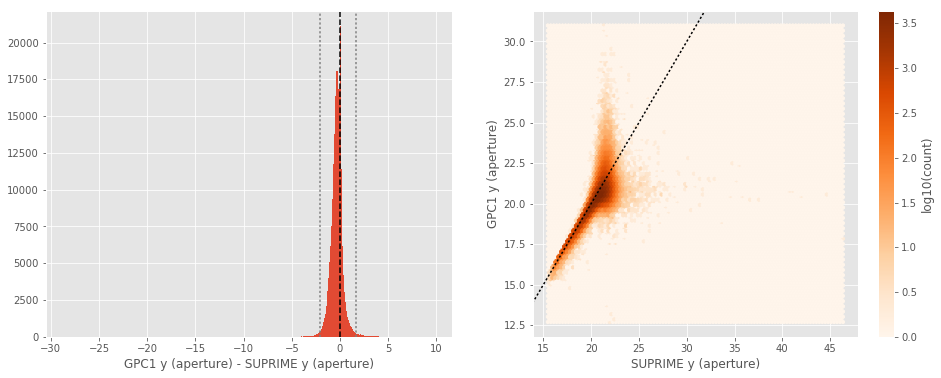

GPC1 y (total) - SUPRIME y (total):
- Median: 0.07
- Median Absolute Deviation: 0.29
- 1% percentile: -2.2872619819641113
- 99% percentile: 1.6790031433105388


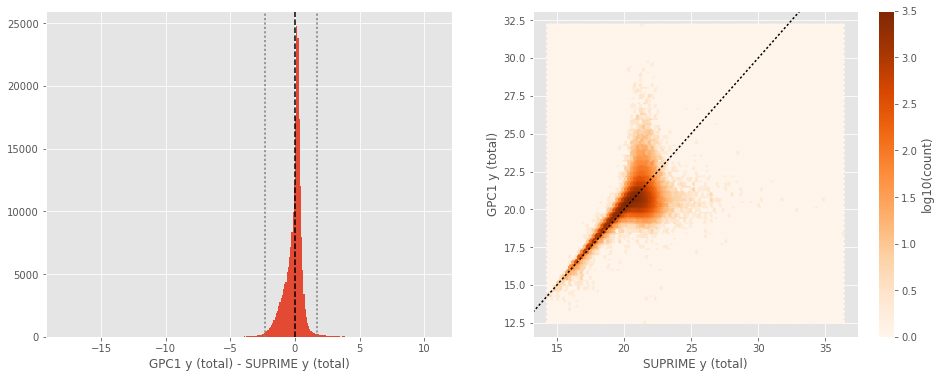

DECam y (aperture) - SUPRIME y (aperture):
- Median: 0.09
- Median Absolute Deviation: 0.26
- 1% percentile: -1.4609357070922853
- 99% percentile: 2.9194031906127877


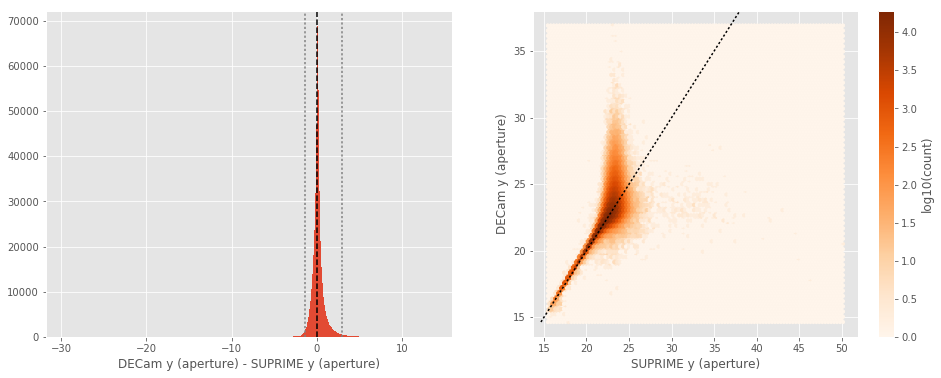

DECam y (total) - SUPRIME y (total):
- Median: 0.09
- Median Absolute Deviation: 0.35
- 1% percentile: -2.0030963134765623
- 99% percentile: 3.3678937530517645


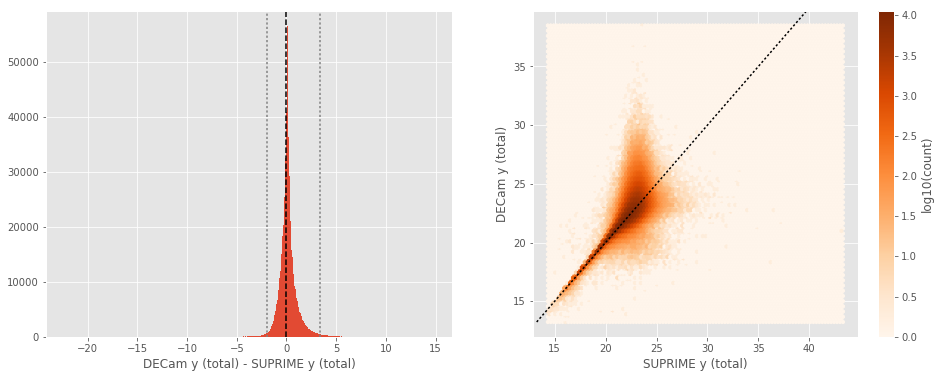

VISTA Y (aperture) - SUPRIME y (aperture):
- Median: -0.02
- Median Absolute Deviation: 0.23
- 1% percentile: -3.087427635192871
- 99% percentile: 1.6947448730468935


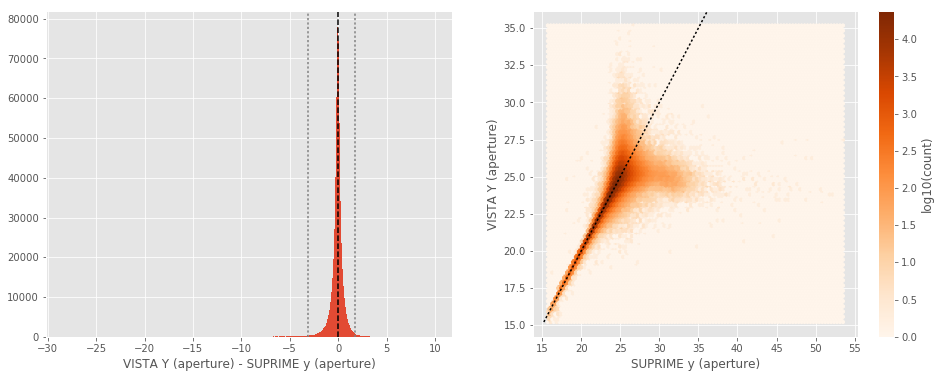

VISTA Y (total) - SUPRIME y (total):
- Median: 0.10
- Median Absolute Deviation: 0.33
- 1% percentile: -2.8650838851928713
- 99% percentile: 2.790845870971678


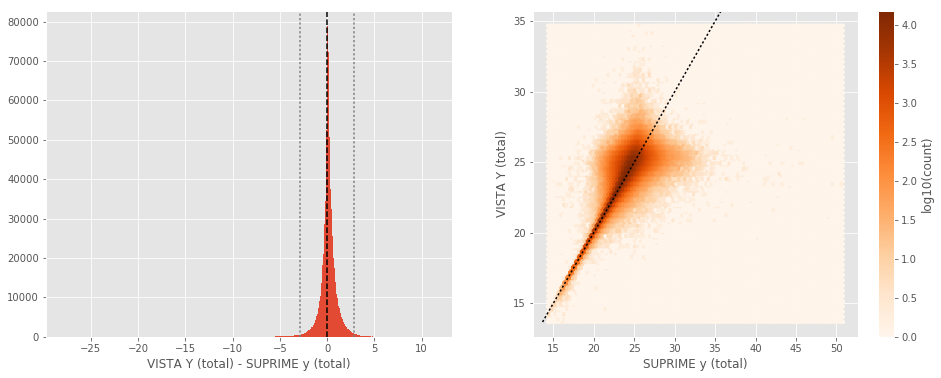

DECam y (aperture) - GPC1 y (aperture):
- Median: 0.38
- Median Absolute Deviation: 0.33
- 1% percentile: -1.5393833351135253
- 99% percentile: 2.6004552078247065


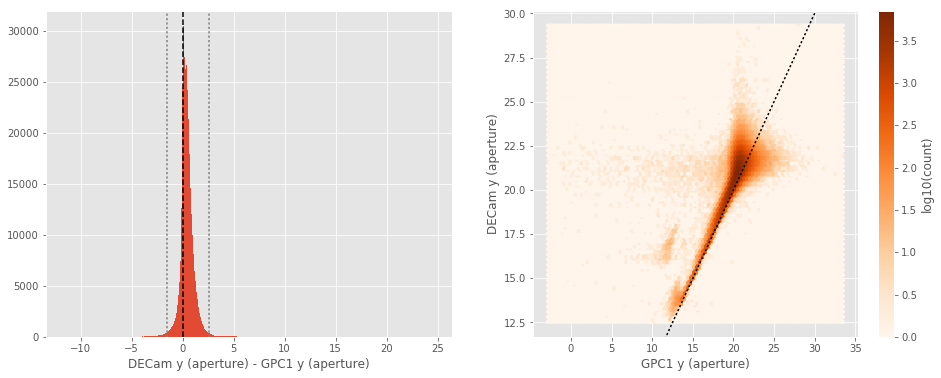

DECam y (total) - GPC1 y (total):
- Median: -0.02
- Median Absolute Deviation: 0.27
- 1% percentile: -1.6514144897460938
- 99% percentile: 2.8469280242919908


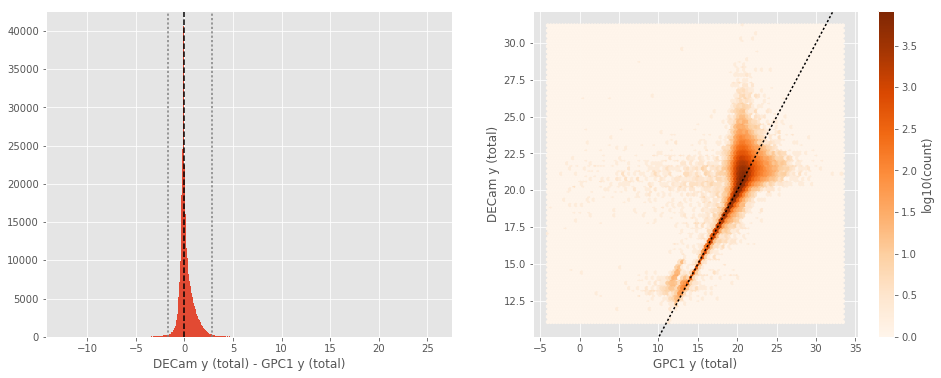

VISTA Y (aperture) - GPC1 y (aperture):
- Median: 0.20
- Median Absolute Deviation: 0.25
- 1% percentile: -1.5711625671386718
- 99% percentile: 1.9135727691650388


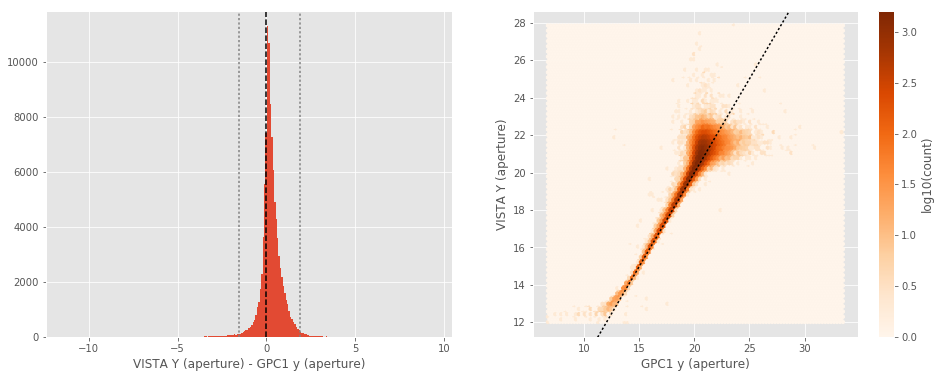

VISTA Y (total) - GPC1 y (total):
- Median: -0.10
- Median Absolute Deviation: 0.27
- 1% percentile: -1.6935344505310055
- 99% percentile: 2.2822624969482423


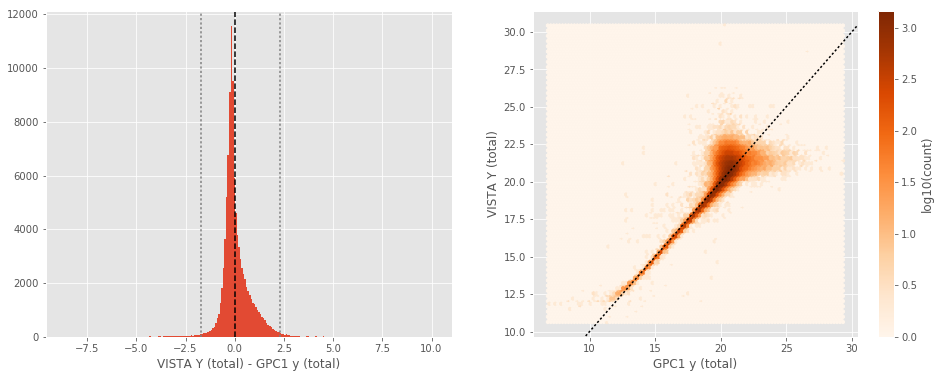

VISTA Y (aperture) - DECam y (aperture):
- Median: -0.15
- Median Absolute Deviation: 0.25
- 1% percentile: -2.877870559692383
- 99% percentile: 1.2529420852661133


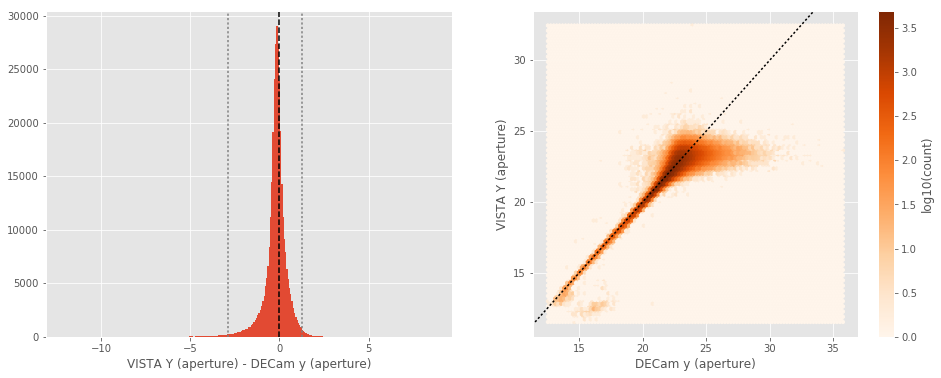

VISTA Y (total) - DECam y (total):
- Median: -0.09
- Median Absolute Deviation: 0.31
- 1% percentile: -3.1509500885009762
- 99% percentile: 1.7540818977355808


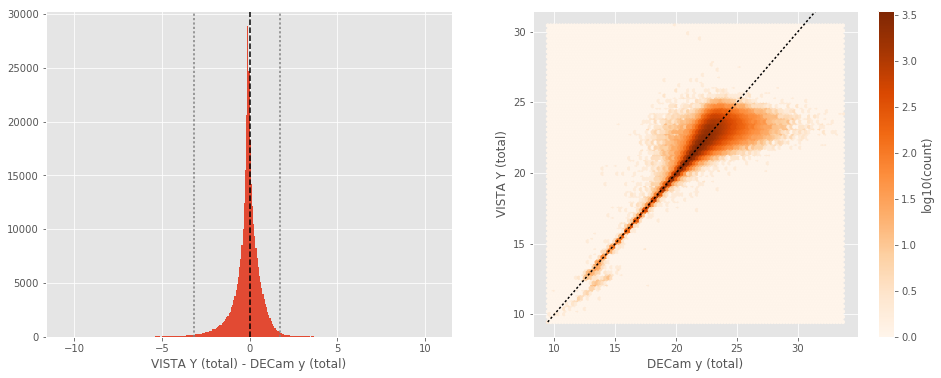

UKIDSS J (aperture) - VISTA J (aperture):
- Median: 0.07
- Median Absolute Deviation: 0.16
- 1% percentile: -1.9190846061706544
- 99% percentile: 1.0688185501098633


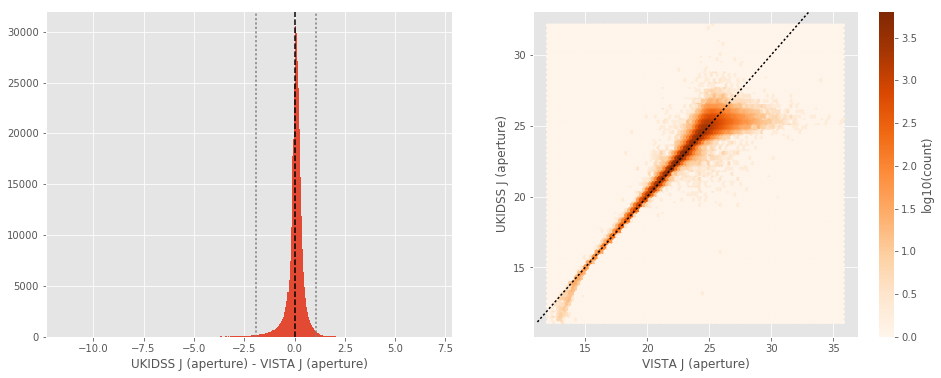

UKIDSS J (total) - VISTA J (total):
- Median: -0.04
- Median Absolute Deviation: 0.20
- 1% percentile: -1.996765956878662
- 99% percentile: 1.1238769531250008


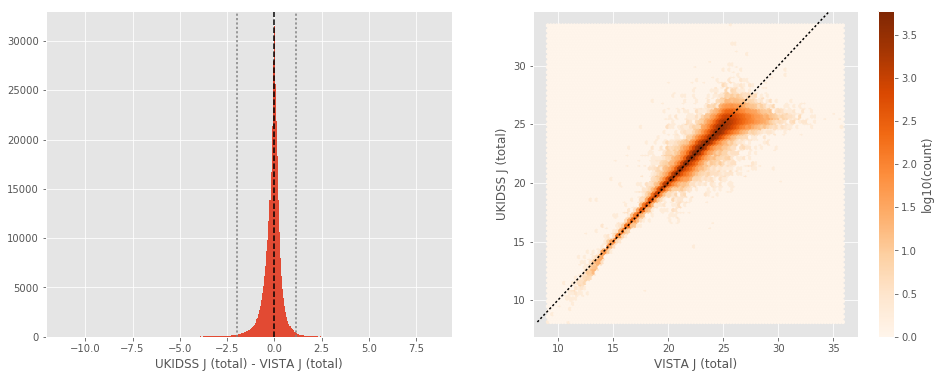

WIRCAM J (aperture) - VISTA J (aperture):
- Median: 0.17
- Median Absolute Deviation: 0.18
- 1% percentile: -1.1215943145751952
- 99% percentile: 2.141083145141601


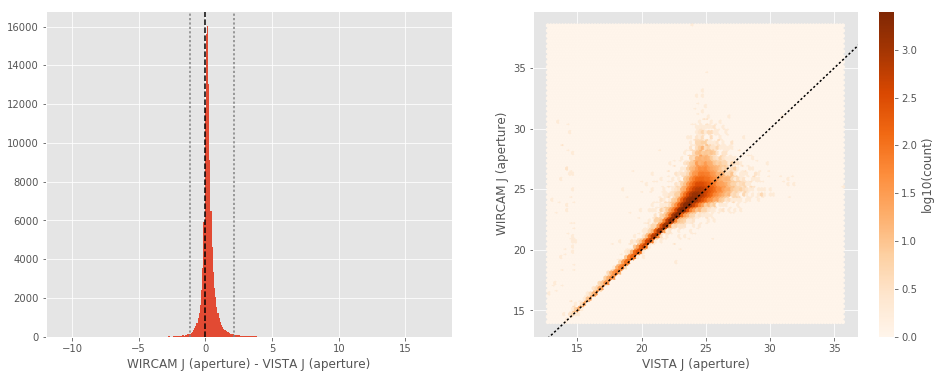

WIRCAM J (total) - VISTA J (total):
- Median: -0.00
- Median Absolute Deviation: 0.20
- 1% percentile: -1.3996848678588867
- 99% percentile: 2.288000526428222


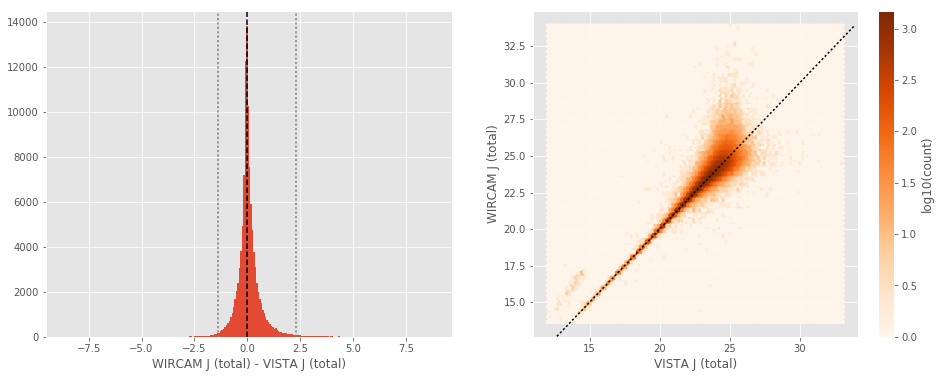

WIRCAM J (aperture) - UKIDSS J (aperture):
- Median: 0.11
- Median Absolute Deviation: 0.08
- 1% percentile: -0.32466945648193357
- 99% percentile: 1.1296821784973141


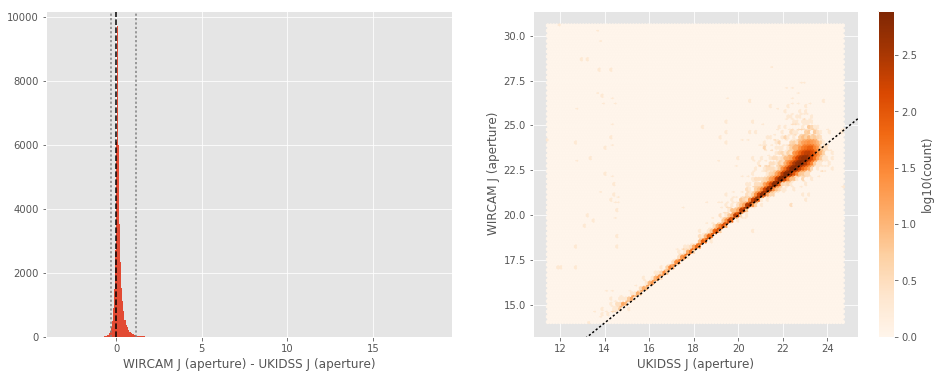

WIRCAM J (total) - UKIDSS J (total):
- Median: -0.08
- Median Absolute Deviation: 0.17
- 1% percentile: -0.9389879035949706
- 99% percentile: 1.6195438385009657


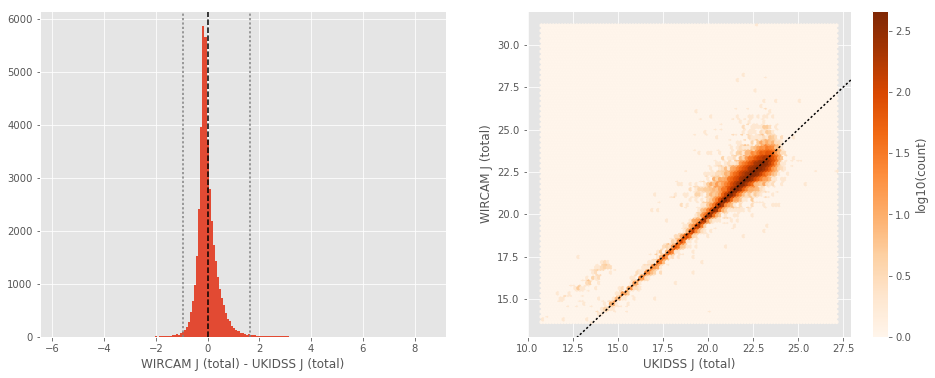

UKIDSS H (aperture) - VISTA H (aperture):
- Median: 0.15
- Median Absolute Deviation: 0.19
- 1% percentile: -2.3486846351623534
- 99% percentile: 1.417771091461188


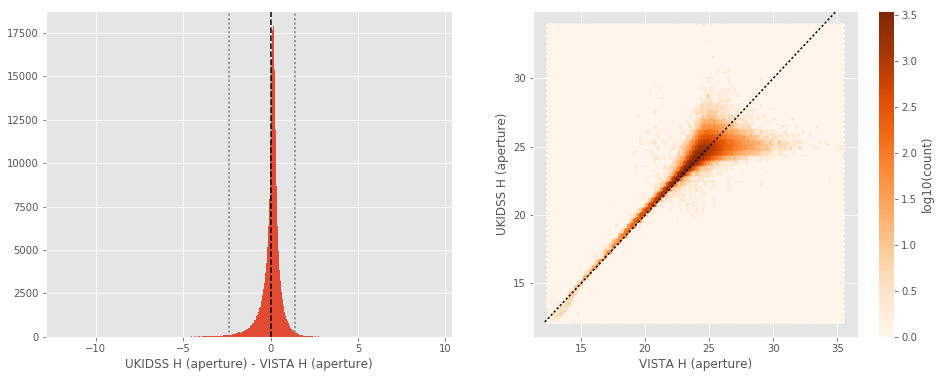

UKIDSS H (total) - VISTA H (total):
- Median: -0.09
- Median Absolute Deviation: 0.20
- 1% percentile: -2.3609312438964842
- 99% percentile: 1.3909326171875


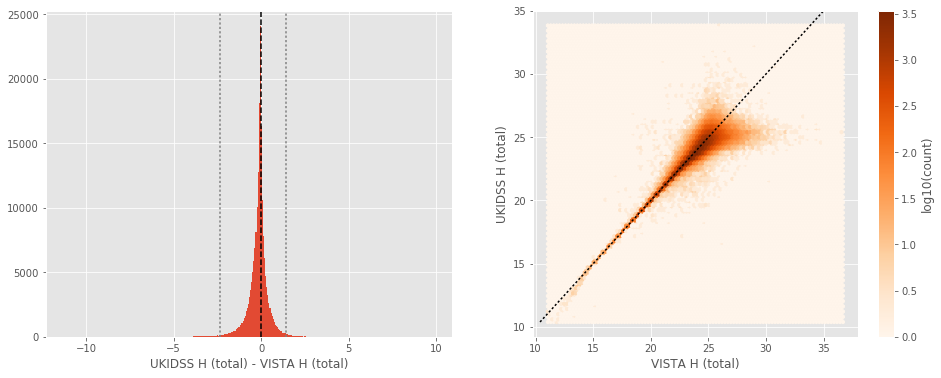

WIRCAM H (aperture) - VISTA H (aperture):
- Median: 0.09
- Median Absolute Deviation: 0.17
- 1% percentile: -1.3035173034667968
- 99% percentile: 1.9530482482910159


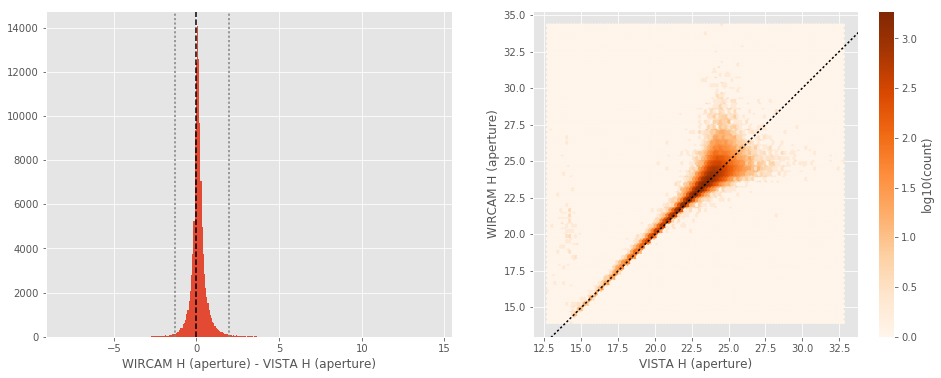

WIRCAM H (total) - VISTA H (total):
- Median: -0.05
- Median Absolute Deviation: 0.20
- 1% percentile: -1.459299545288086
- 99% percentile: 2.1663842773437487


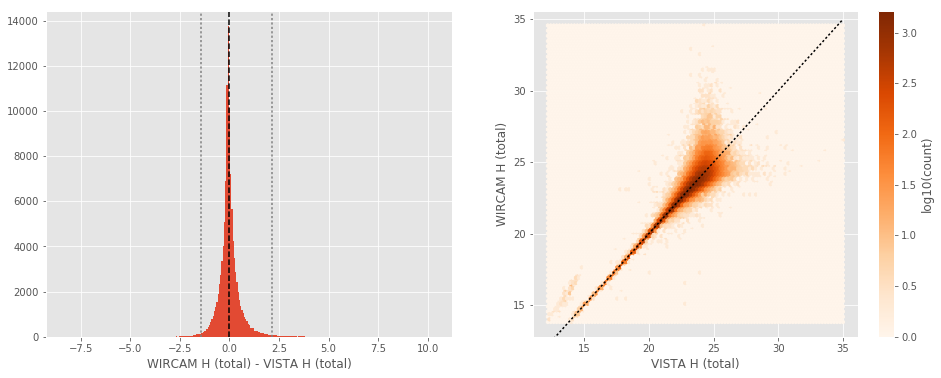

No sources have both UKIDSS H (aperture) and WIRCAM H (aperture) values.
No sources have both UKIDSS H (total) and WIRCAM H (total) values.
UKIDSS K (aperture) - VISTA Ks (aperture):
- Median: 0.06
- Median Absolute Deviation: 0.14
- 1% percentile: -1.9586513710021973
- 99% percentile: 1.1346926116943385


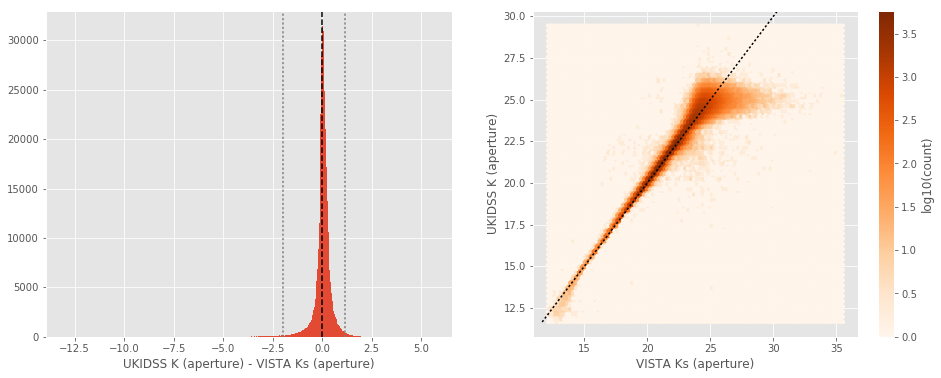

UKIDSS K (total) - VISTA Ks (total):
- Median: -0.00
- Median Absolute Deviation: 0.20
- 1% percentile: -2.1291068267822264
- 99% percentile: 1.141293087005619


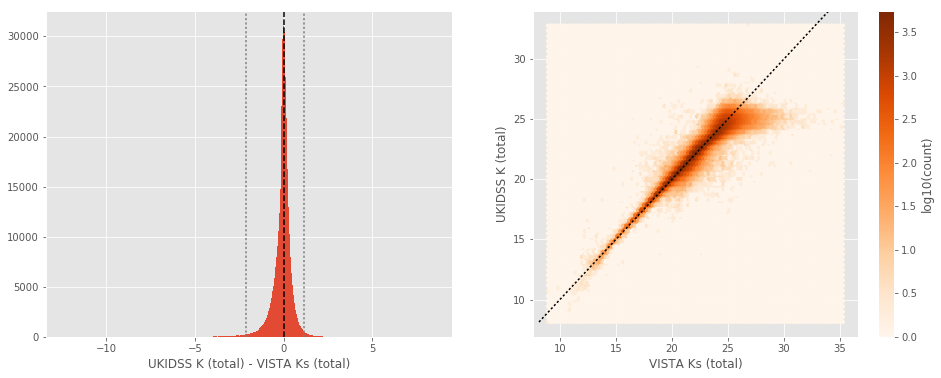

WIRCAM Ks (aperture) - VISTA Ks (aperture):
- Median: 0.11
- Median Absolute Deviation: 0.16
- 1% percentile: -1.7124255752563475
- 99% percentile: 1.2553991127014184


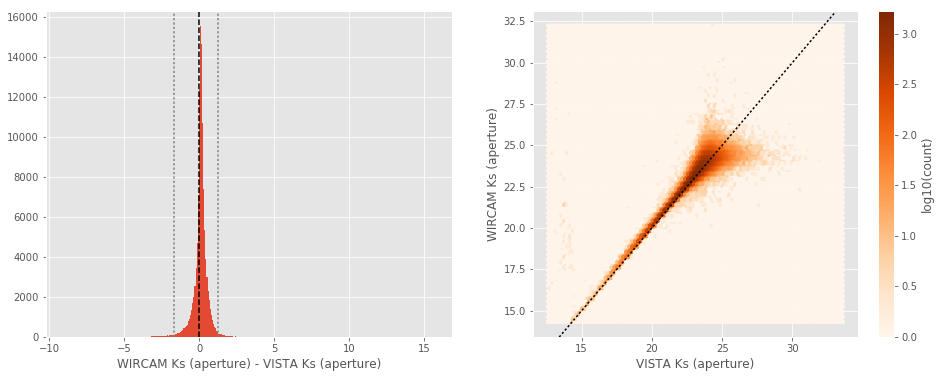

WIRCAM Ks (total) - VISTA Ks (total):
- Median: -0.07
- Median Absolute Deviation: 0.17
- 1% percentile: -1.9729717254638672
- 99% percentile: 1.2284774780273449


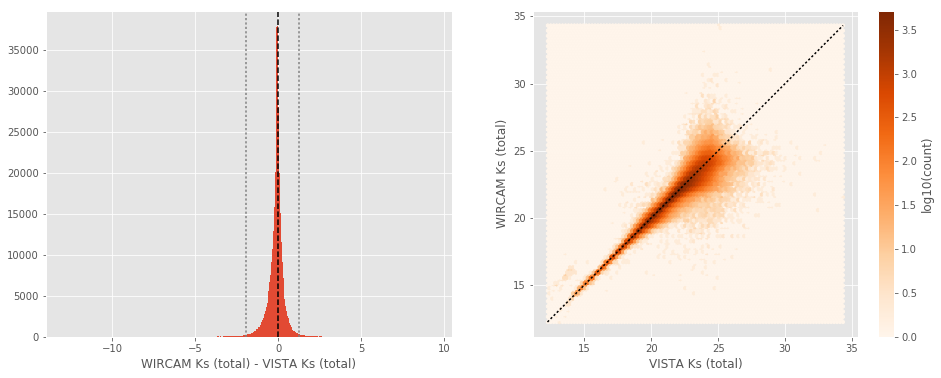

WIRCAM Ks (aperture) - UKIDSS K (aperture):
- Median: 0.09
- Median Absolute Deviation: 0.08
- 1% percentile: -0.4083726501464844
- 99% percentile: 0.9650620651245115


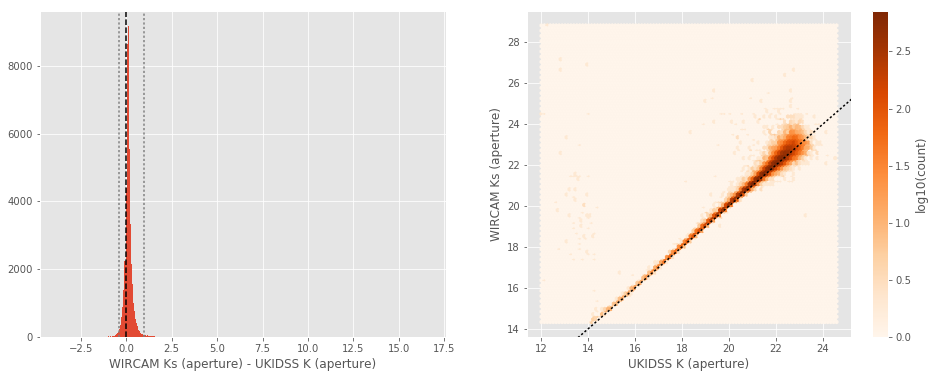

WIRCAM Ks (total) - UKIDSS K (total):
- Median: -0.09
- Median Absolute Deviation: 0.17
- 1% percentile: -1.3401906776428223
- 99% percentile: 1.3497693443298213


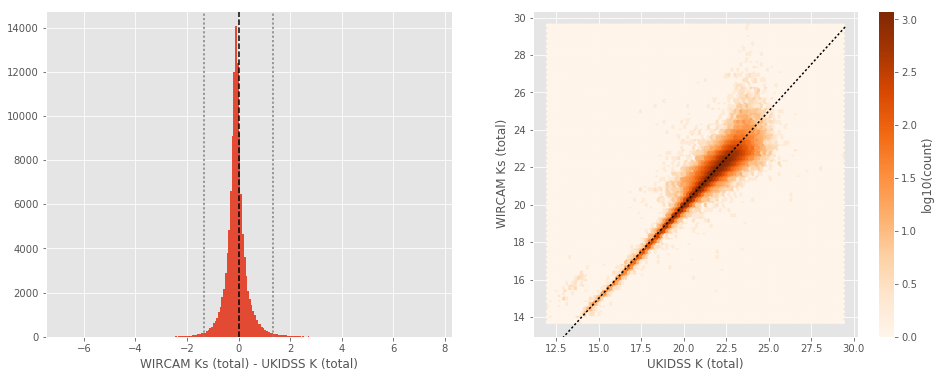

In [10]:
for band_of_a_kind in [u_bands, g_bands, r_bands, i_bands, z_bands, y_bands, j_bands, h_bands, k_bands]:
    for band1, band2 in itertools.combinations(band_of_a_kind, 2):
        
        basecol1, basecol2 = band1.replace(" ", "_").lower(), band2.replace(" ", "_").lower()
        
        col1, col2 = "m_ap_{}".format(basecol1), "m_ap_{}".format(basecol2)
        nb_compare_mags(master_catalogue[col1], master_catalogue[col2], 
                        labels=("{} (aperture)".format(band1), "{} (aperture)".format(band2)))
        
        col1, col2 = "m_{}".format(basecol1), "m_{}".format(basecol2)
        nb_compare_mags(master_catalogue[col1], master_catalogue[col2], 
                        labels=("{} (total)".format(band1), "{} (total)".format(band2)))

## III - Comparing magnitudes to reference bands

Cross-match the master list to SDSS and 2MASS to compare its magnitudes to SDSS and 2MASS ones.

In [11]:
master_catalogue_coords = SkyCoord(master_catalogue['ra'], master_catalogue['dec'])

### III.a - Comparing u, g, r, i, and z bands to SDSS

The catalogue is cross-matched to SDSS-DR13 withing 0.2 arcsecond. 

We compare the u, g, r, i, and z magnitudes to those from SDSS using `fiberMag` for the aperture magnitude and `petroMag`  for the total magnitude.

In [12]:
sdss = Table.read("../../dmu0/dmu0_SDSS-DR13/data/SDSS-DR13_XMM-LSS.fits")
sdss_coords = SkyCoord(sdss['ra'] * u.deg, sdss['dec'] * u.deg)

idx, d2d, _ = sdss_coords.match_to_catalog_sky(master_catalogue_coords)
mask = (d2d < 0.2 * u.arcsec)

sdss = sdss[mask]
ml_sdss_idx = idx[mask]

Megacam u (aperture) - SDSS u (fiberMag):
- Median: -0.16
- Median Absolute Deviation: 0.57
- 1% percentile: -2.2747928047180177
- 99% percentile: 3.36533878326415


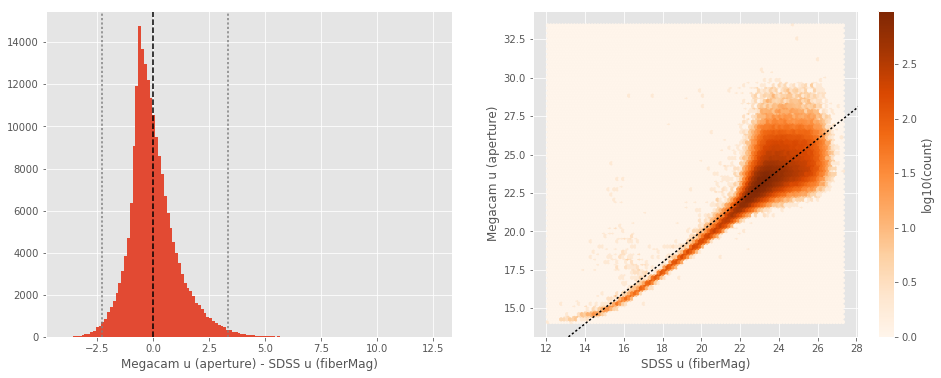

Megacam u (total) - SDSS u (petroMag):
- Median: 0.03
- Median Absolute Deviation: 0.93
- 1% percentile: -4.693710289001465
- 99% percentile: 4.555381507873536


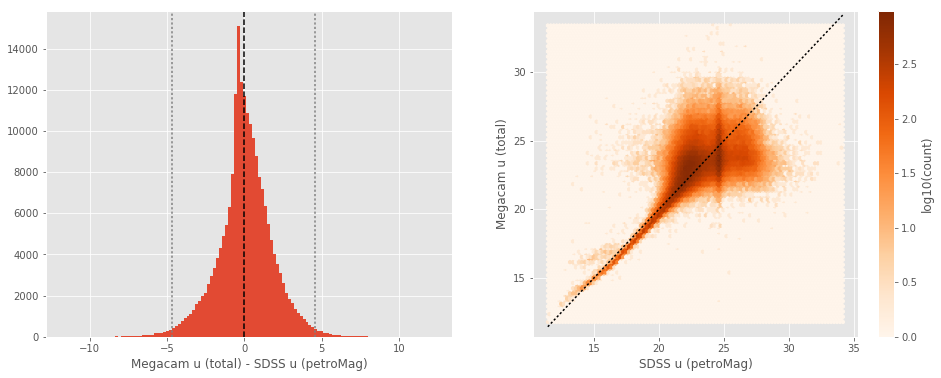

Megacam g (aperture) - SDSS g (fiberMag):
- Median: -0.34
- Median Absolute Deviation: 0.13
- 1% percentile: -1.1238826751708983
- 99% percentile: 0.9107955932617195


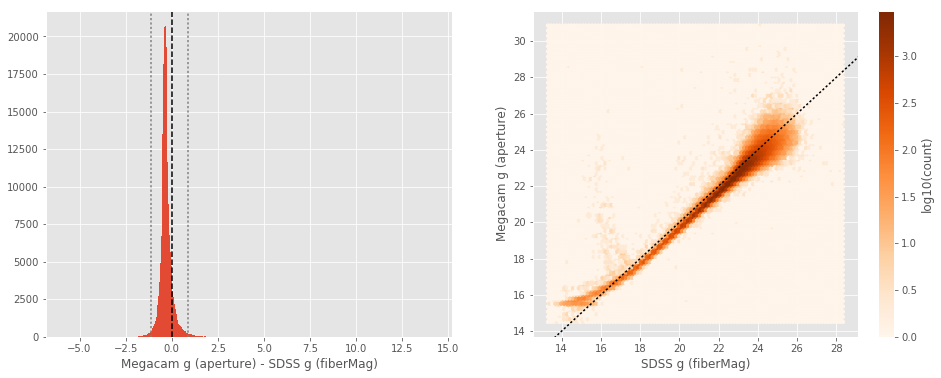

Megacam g (total) - SDSS g (petroMag):
- Median: -0.12
- Median Absolute Deviation: 0.22
- 1% percentile: -3.1879452896118163
- 99% percentile: 1.630353927612306


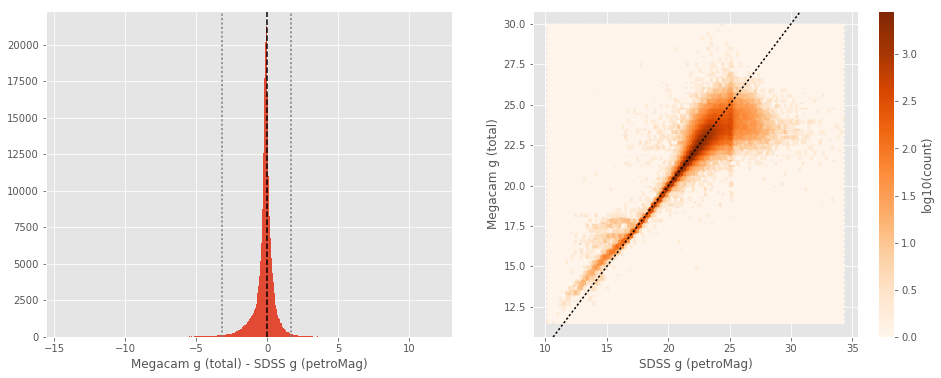

SUPRIME g (aperture) - SDSS g (fiberMag):
- Median: -0.30
- Median Absolute Deviation: 0.17
- 1% percentile: -1.1416707611083985
- 99% percentile: 1.4411949539184539


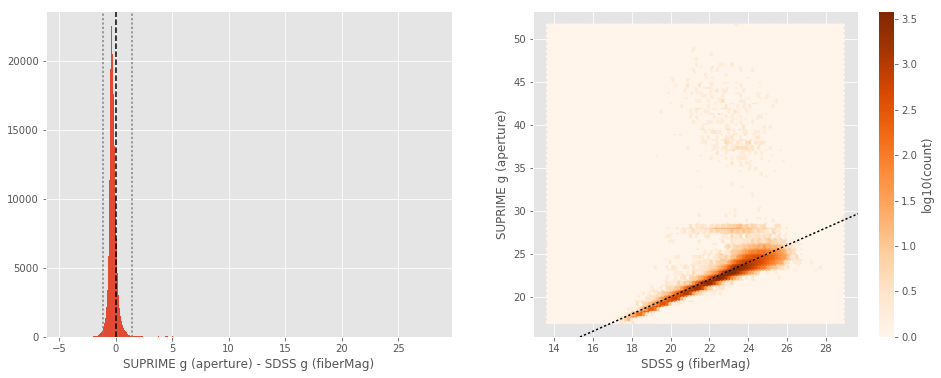

SUPRIME g (total) - SDSS g (petroMag):
- Median: -0.12
- Median Absolute Deviation: 0.23
- 1% percentile: -3.2103882789611813
- 99% percentile: 2.1886862277984545


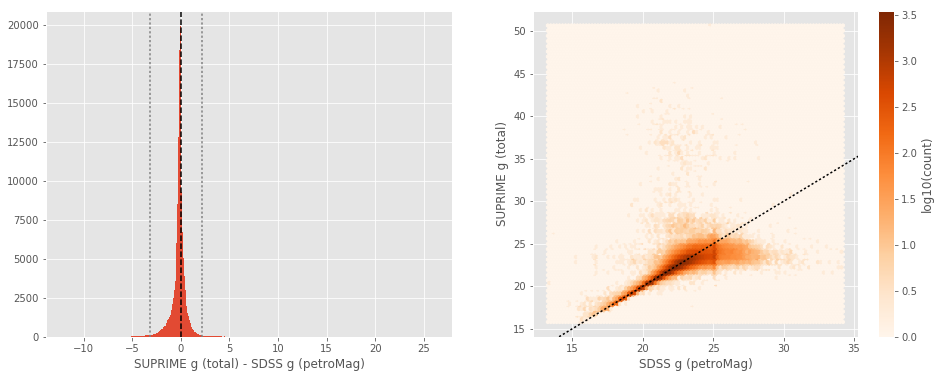

GPC1 g (aperture) - SDSS g (fiberMag):
- Median: -0.56
- Median Absolute Deviation: 0.26
- 1% percentile: -2.6218787002563477
- 99% percentile: 1.695670928955073


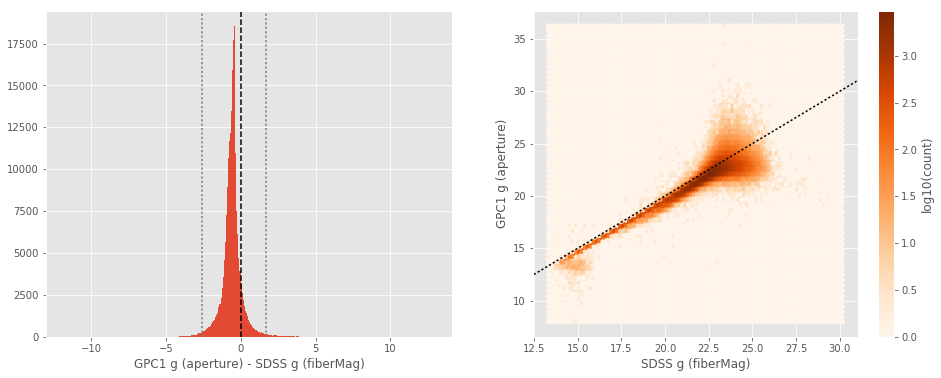

GPC1 g (total) - SDSS g (petroMag):
- Median: -0.08
- Median Absolute Deviation: 0.25
- 1% percentile: -3.995189914703369
- 99% percentile: 1.6608183288574219


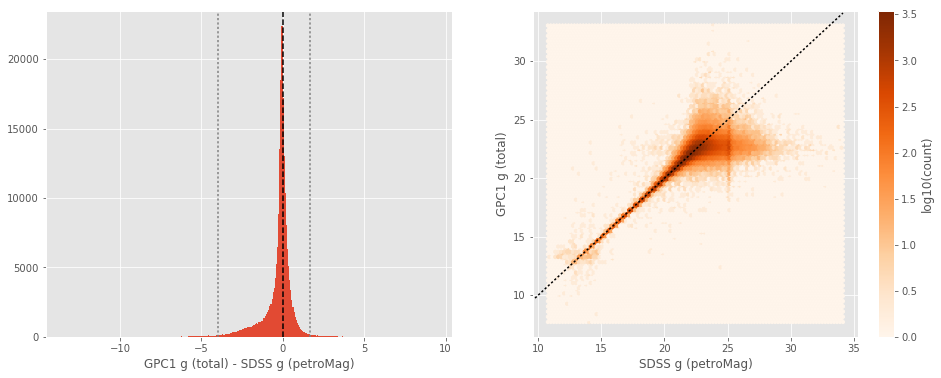

DECam g (aperture) - SDSS g (fiberMag):
- Median: -0.32
- Median Absolute Deviation: 0.17
- 1% percentile: -1.161762390136719
- 99% percentile: 1.0842285919189467


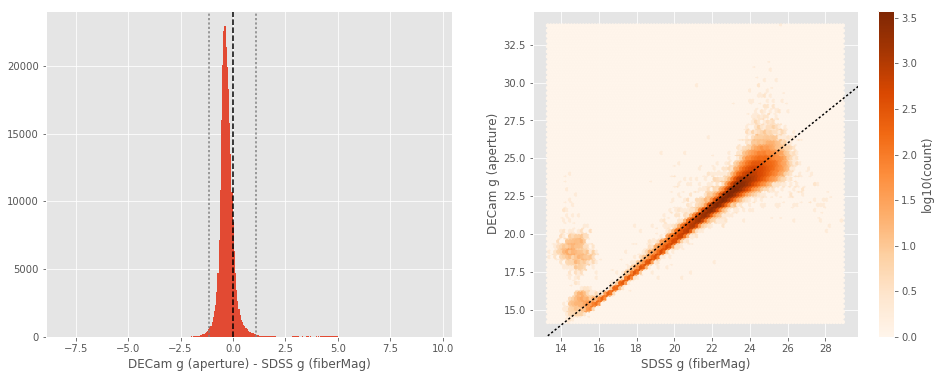

DECam g (total) - SDSS g (petroMag):
- Median: -0.09
- Median Absolute Deviation: 0.21
- 1% percentile: -3.2205306816101076
- 99% percentile: 2.0388721084594716


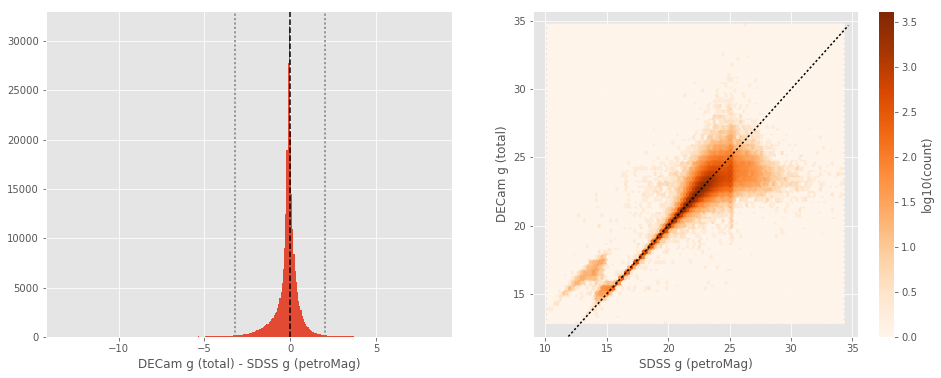

Megacam r (aperture) - SDSS r (fiberMag):
- Median: -0.27
- Median Absolute Deviation: 0.09
- 1% percentile: -0.9251380729675294
- 99% percentile: 0.5400785827636716


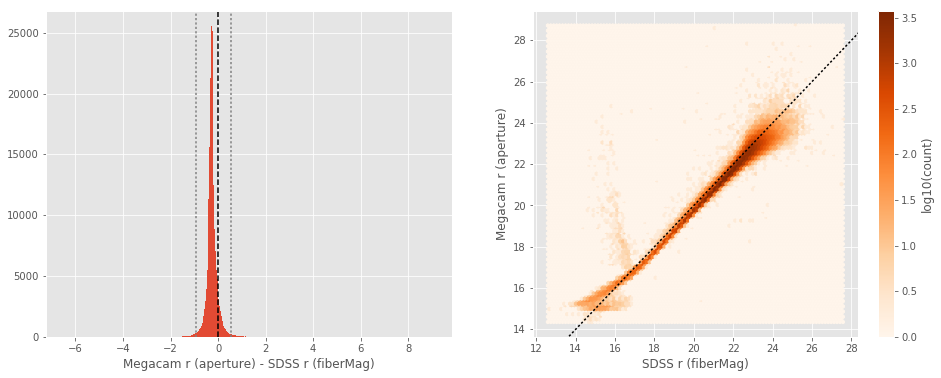

Megacam r (total) - SDSS r (petroMag):
- Median: -0.02
- Median Absolute Deviation: 0.15
- 1% percentile: -2.6643548011779785
- 99% percentile: 1.324775218963623


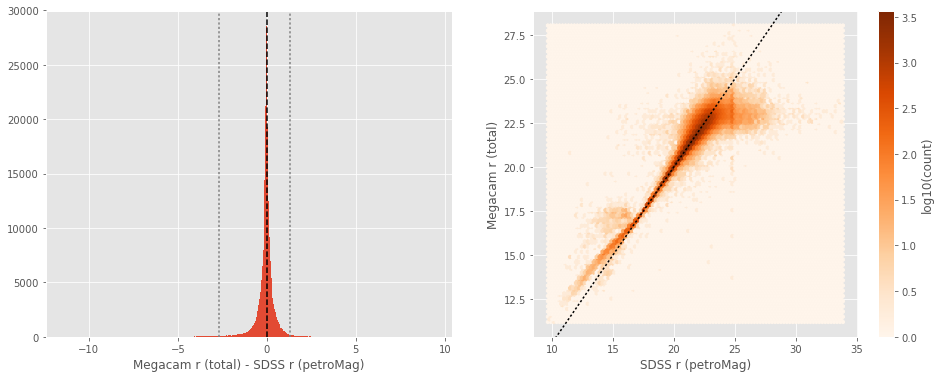

SUPRIME r (aperture) - SDSS r (fiberMag):
- Median: -0.29
- Median Absolute Deviation: 0.13
- 1% percentile: -0.9902065849304199
- 99% percentile: 1.1700545120239263


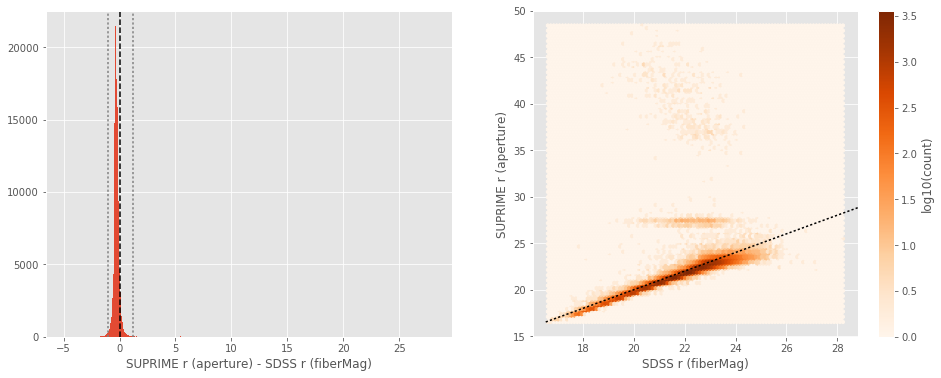

SUPRIME r (total) - SDSS r (petroMag):
- Median: -0.08
- Median Absolute Deviation: 0.17
- 1% percentile: -2.7669961929321287
- 99% percentile: 2.01519500732422


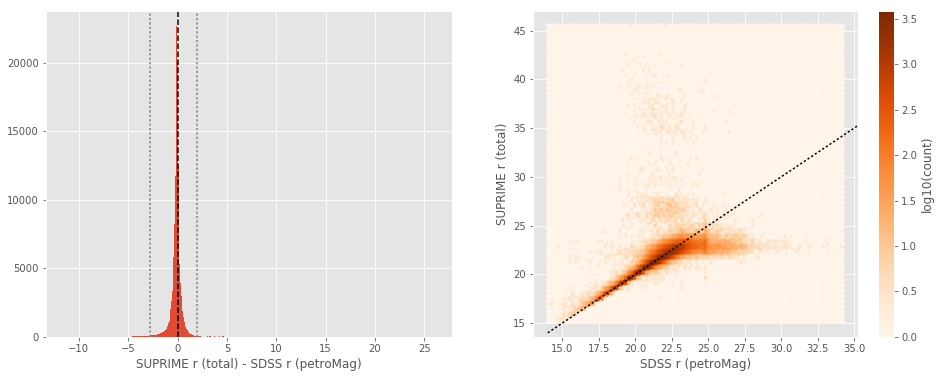

GPC1 r (aperture) - SDSS r (fiberMag):
- Median: -0.43
- Median Absolute Deviation: 0.17
- 1% percentile: -1.6574340057373047
- 99% percentile: 0.9487522697448594


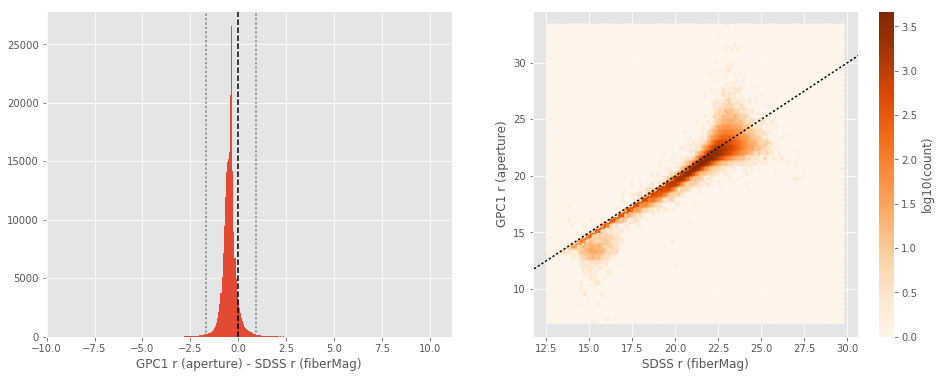

GPC1 r (total) - SDSS r (petroMag):
- Median: 0.04
- Median Absolute Deviation: 0.14
- 1% percentile: -2.530843811035156
- 99% percentile: 1.2362999725341777


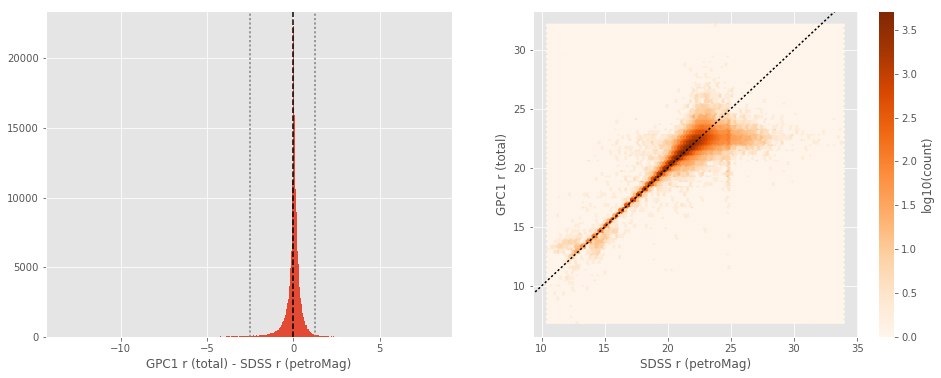

DECam r (aperture) - SDSS r (fiberMag):
- Median: -0.36
- Median Absolute Deviation: 0.15
- 1% percentile: -1.119642448425293
- 99% percentile: 3.1019559001922388


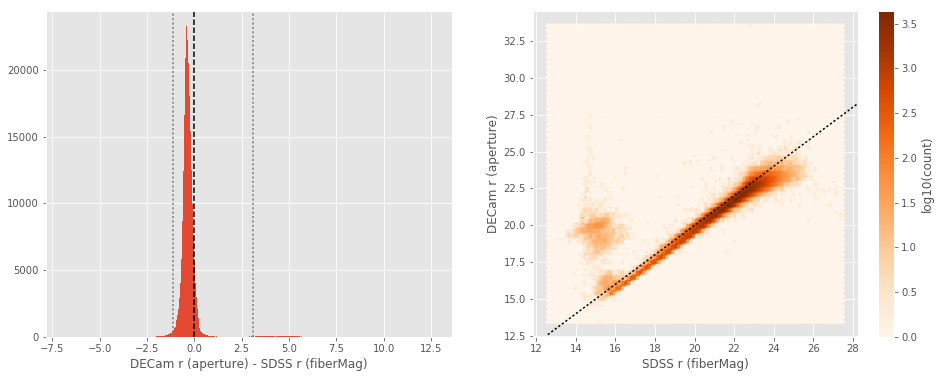

DECam r (total) - SDSS r (petroMag):
- Median: -0.13
- Median Absolute Deviation: 0.15
- 1% percentile: -2.9229142379760744
- 99% percentile: 2.688230495452861


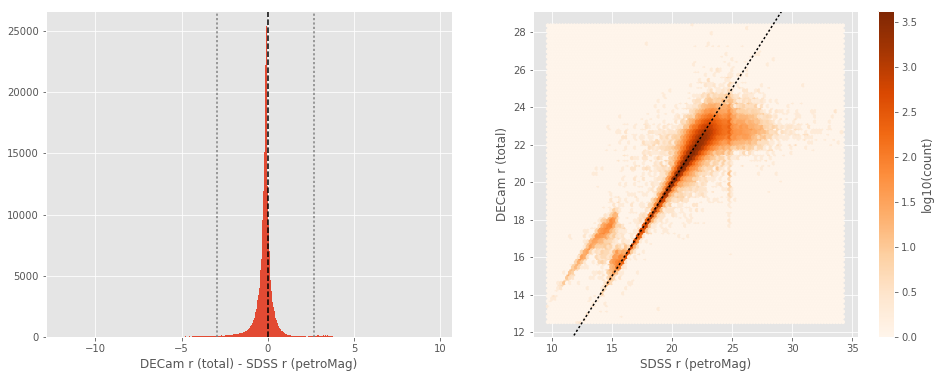

Megacam i (aperture) - SDSS i (fiberMag):
- Median: -0.33
- Median Absolute Deviation: 0.09
- 1% percentile: -0.9270371246337892
- 99% percentile: 0.5741112899780275


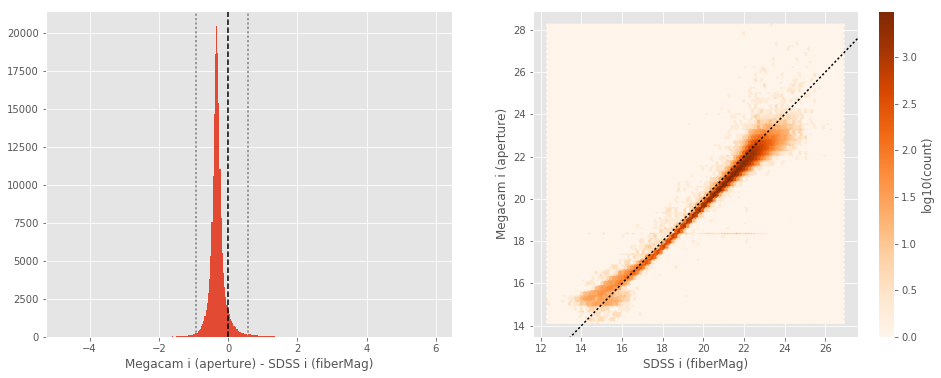

Megacam i (total) - SDSS i (petroMag):
- Median: -0.05
- Median Absolute Deviation: 0.15
- 1% percentile: -3.2480274200439454
- 99% percentile: 1.1342208862304668


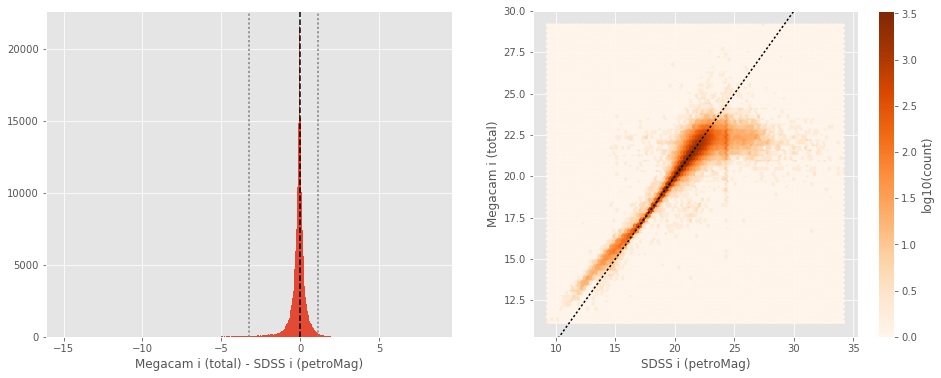

SUPRIME i (aperture) - SDSS i (fiberMag):
- Median: -0.30
- Median Absolute Deviation: 0.13
- 1% percentile: -0.943689136505127
- 99% percentile: 4.505843524932862


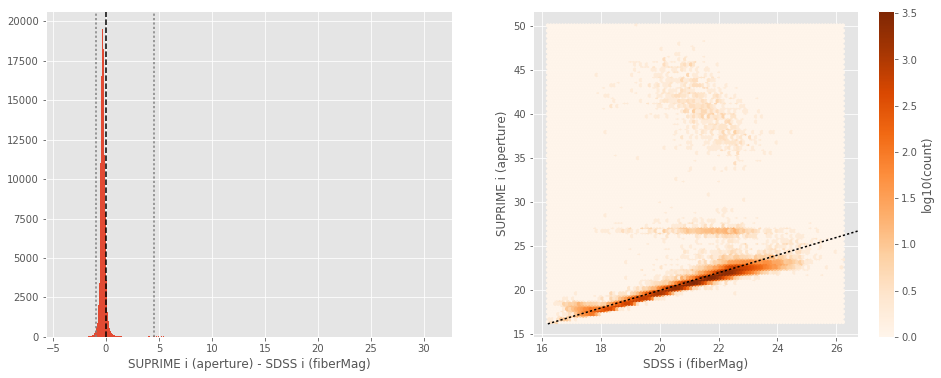

SUPRIME i (total) - SDSS i (petroMag):
- Median: -0.13
- Median Absolute Deviation: 0.17
- 1% percentile: -3.391044464111328
- 99% percentile: 4.58060661315921


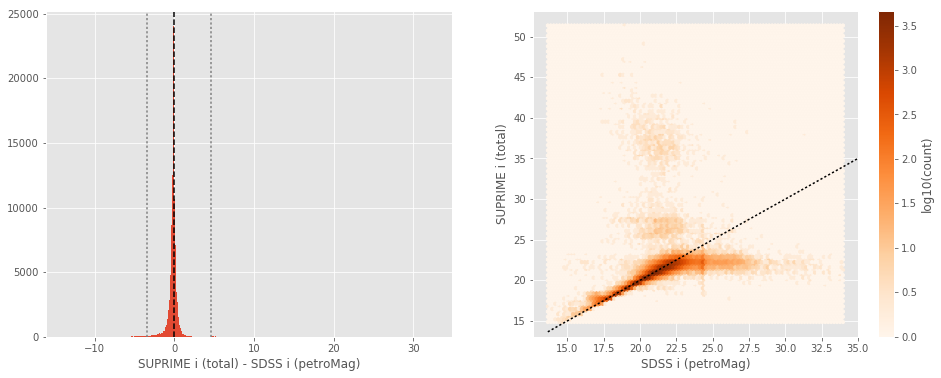

GPC1 i (aperture) - SDSS i (fiberMag):
- Median: -0.41
- Median Absolute Deviation: 0.11
- 1% percentile: -1.1639885711669922
- 99% percentile: 0.26225265502929745


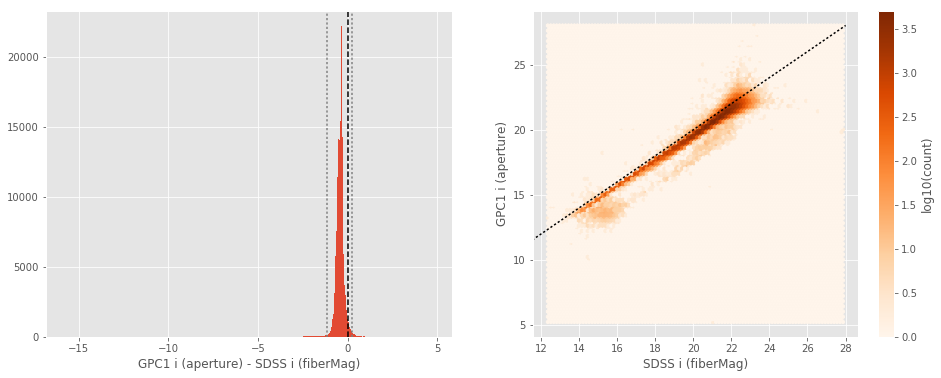

GPC1 i (total) - SDSS i (petroMag):
- Median: 0.04
- Median Absolute Deviation: 0.12
- 1% percentile: -2.395317916870117
- 99% percentile: 0.9681842041015645


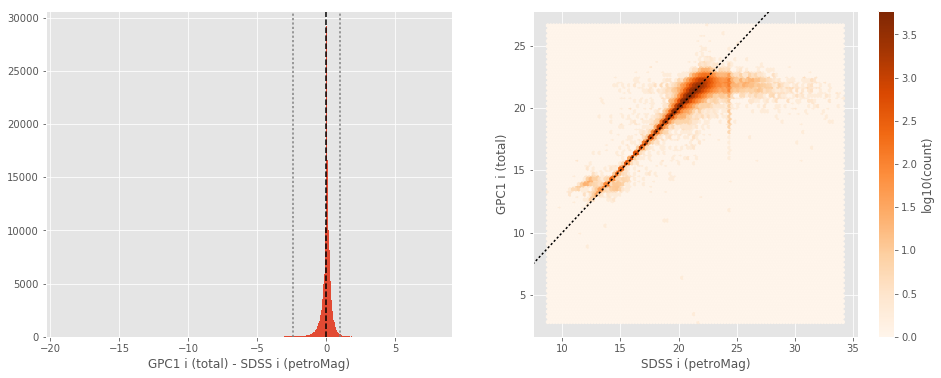

DECam i (aperture) - SDSS i (fiberMag):
- Median: -0.33
- Median Absolute Deviation: 0.15
- 1% percentile: -0.9735076904296875
- 99% percentile: 4.221790027618398


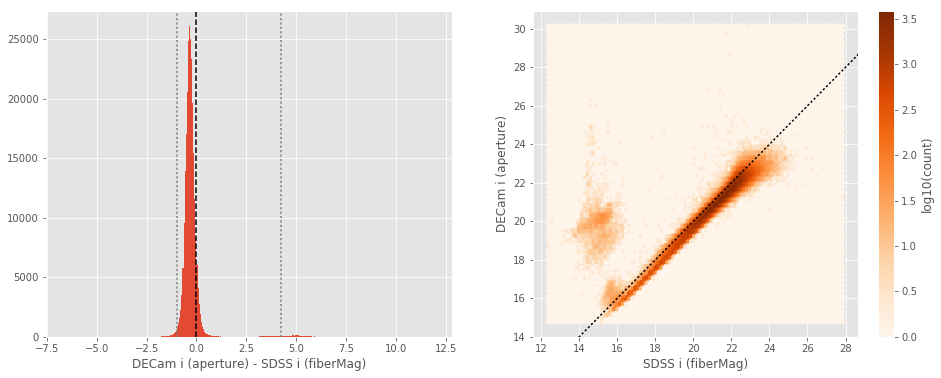

DECam i (total) - SDSS i (petroMag):
- Median: -0.11
- Median Absolute Deviation: 0.16
- 1% percentile: -3.4034982299804692
- 99% percentile: 3.0517770004272413


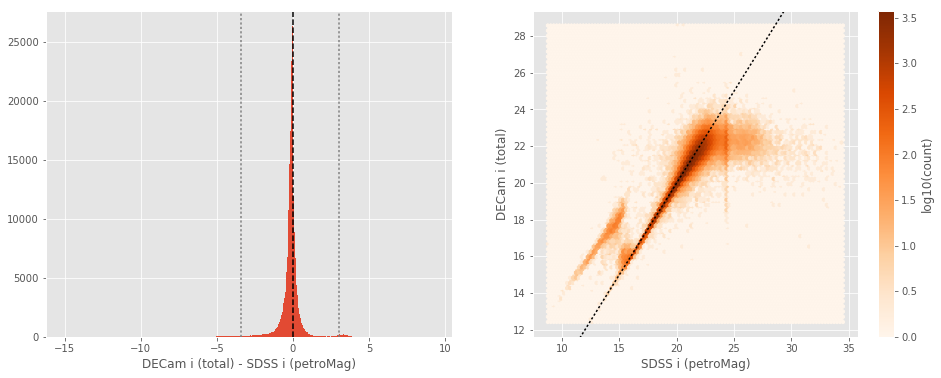

Megacam z (aperture) - SDSS z (fiberMag):
- Median: -0.17
- Median Absolute Deviation: 0.15
- 1% percentile: -1.1774997901916504
- 99% percentile: 1.1188054084777836


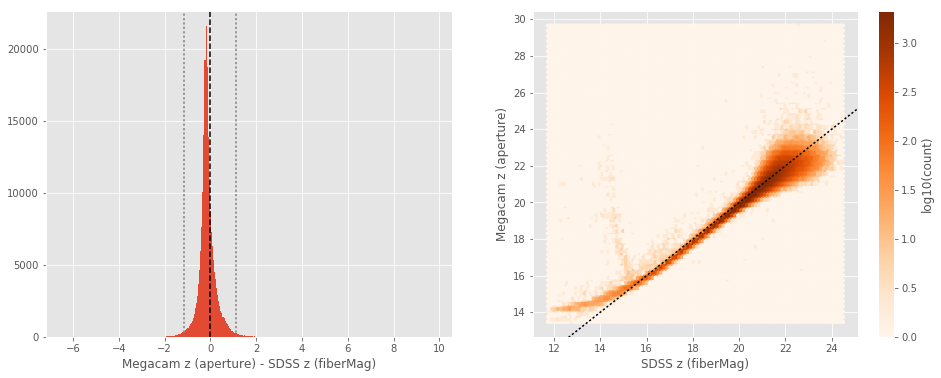

Megacam z (total) - SDSS z (petroMag):
- Median: 0.05
- Median Absolute Deviation: 0.31
- 1% percentile: -3.574903450012207
- 99% percentile: 1.9357566261291472


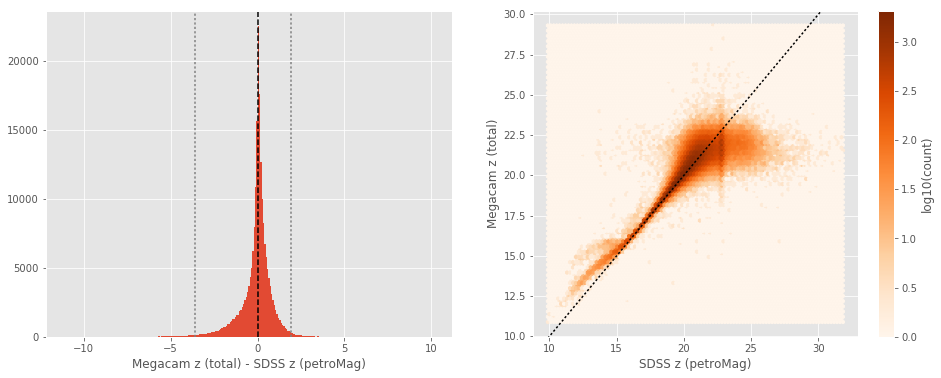

SUPRIME z (aperture) - SDSS z (fiberMag):
- Median: -0.21
- Median Absolute Deviation: 0.19
- 1% percentile: -1.2239848136901856
- 99% percentile: 1.9439543151855416


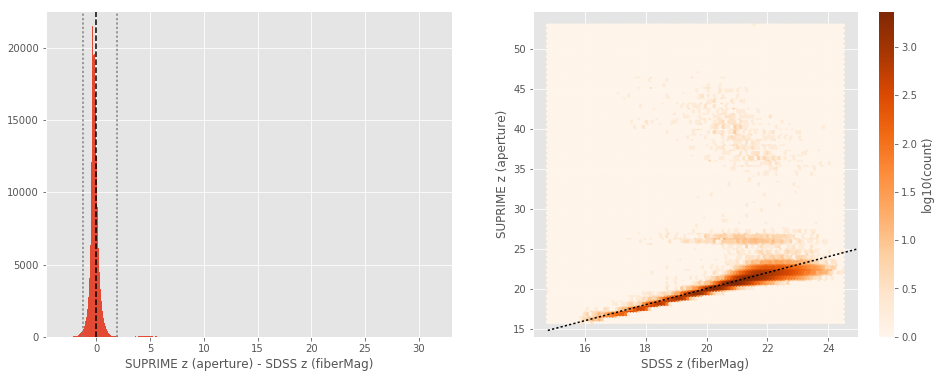

SUPRIME z (total) - SDSS z (petroMag):
- Median: -0.02
- Median Absolute Deviation: 0.32
- 1% percentile: -3.659994201660156
- 99% percentile: 2.711654281616212


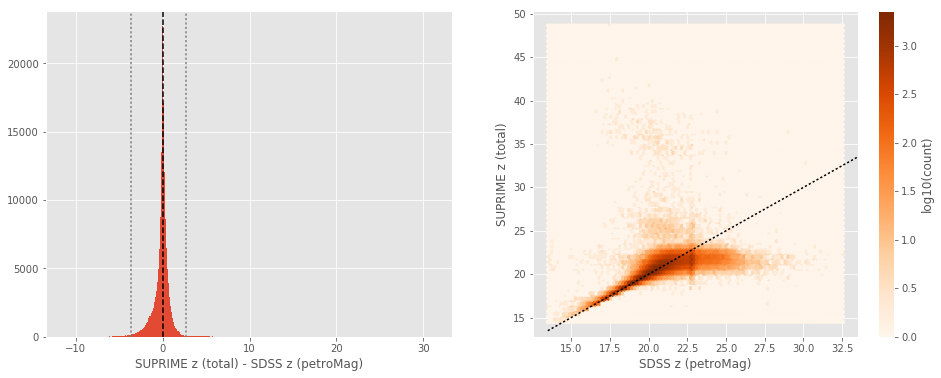

GPC1 z (aperture) - SDSS z (fiberMag):
- Median: -0.31
- Median Absolute Deviation: 0.16
- 1% percentile: -1.5094199180603027
- 99% percentile: 0.8233609199523926


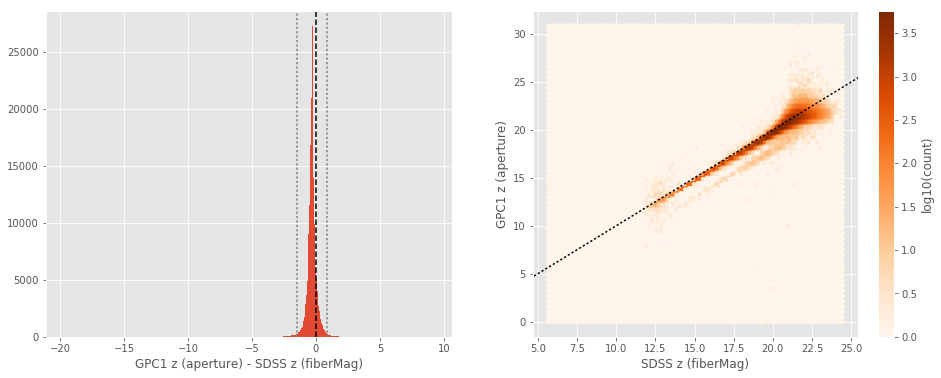

GPC1 z (total) - SDSS z (petroMag):
- Median: 0.12
- Median Absolute Deviation: 0.26
- 1% percentile: -3.4634826660156253
- 99% percentile: 1.6262537765502847


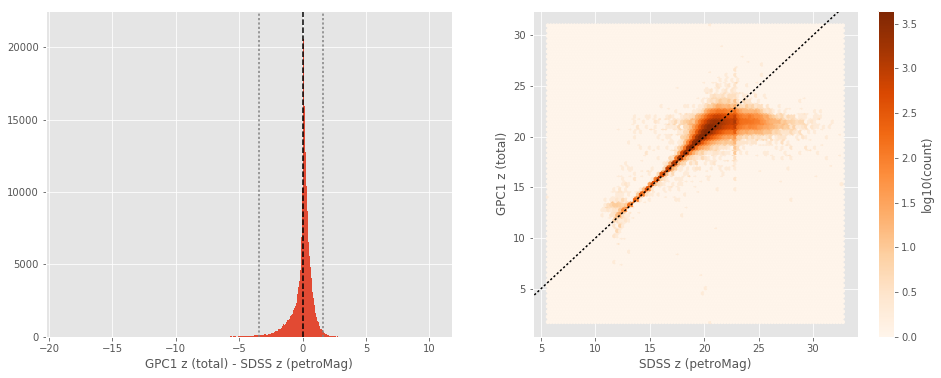

DECam z (aperture) - SDSS z (fiberMag):
- Median: -0.23
- Median Absolute Deviation: 0.20
- 1% percentile: -1.268011703491211
- 99% percentile: 4.757902879714976


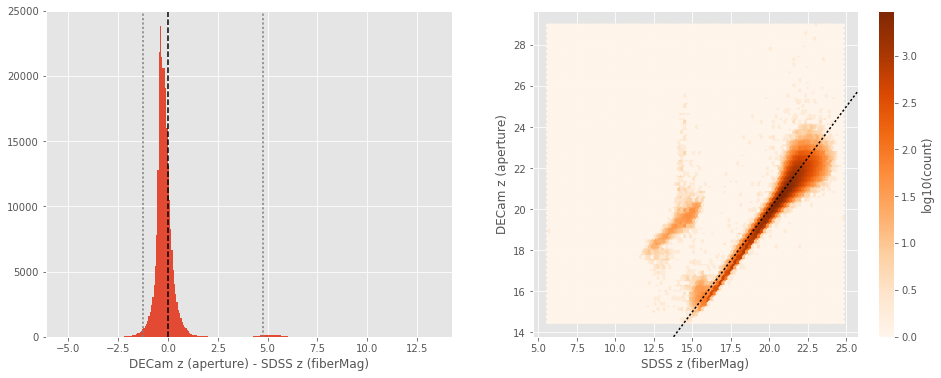

DECam z (total) - SDSS z (petroMag):
- Median: -0.03
- Median Absolute Deviation: 0.32
- 1% percentile: -3.720550765991211
- 99% percentile: 2.8797466278076174


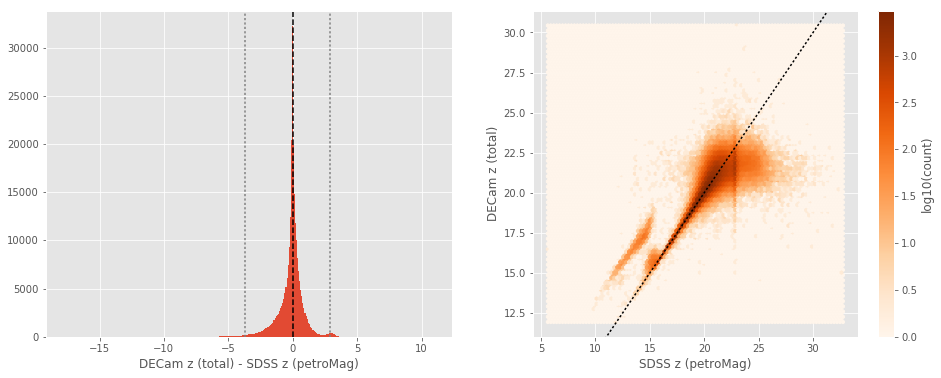

VISTA Z (aperture) - SDSS Z (fiberMag):
- Median: -0.18
- Median Absolute Deviation: 0.17
- 1% percentile: -1.1833677864074708
- 99% percentile: 7.613141555786134


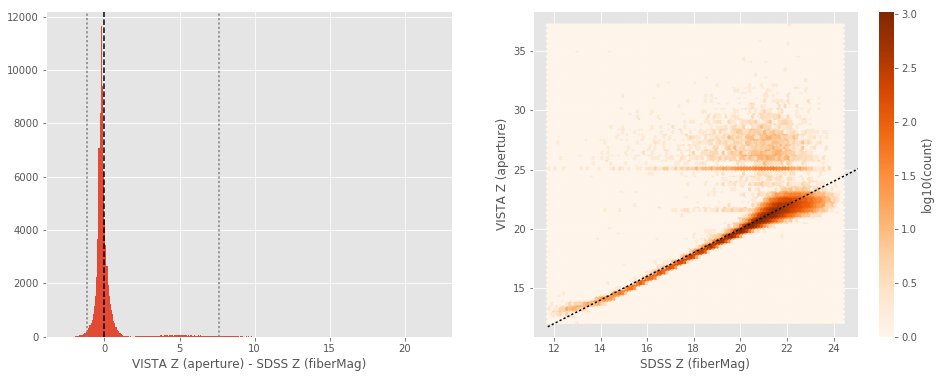

VISTA Z (total) - SDSS Z (petroMag):
- Median: 0.01
- Median Absolute Deviation: 0.34
- 1% percentile: -3.6963905906677246
- 99% percentile: 7.246332988739018


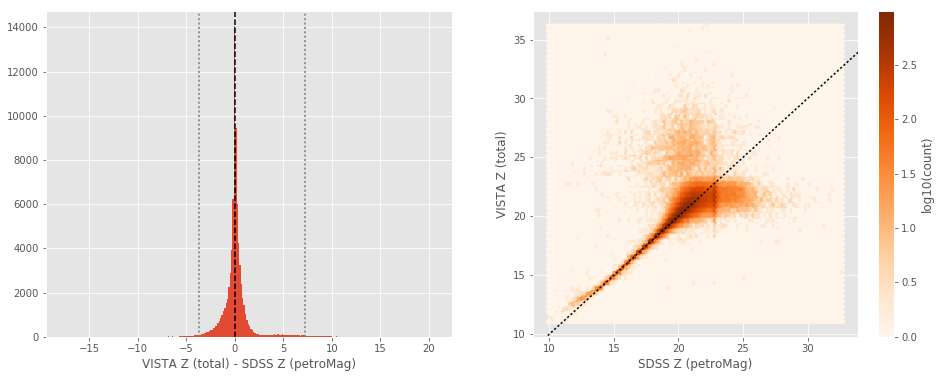

In [13]:
for band_of_a_kind in [u_bands, g_bands, r_bands, i_bands, z_bands]:
    for band in band_of_a_kind:
        
        sdss_mag_ap = sdss["fiberMag_{}".format(band[-1].lower())]
        master_cat_mag_ap = master_catalogue["m_ap_{}".format(band.replace(" ", "_").lower())][ml_sdss_idx]
    
        nb_compare_mags(sdss_mag_ap, master_cat_mag_ap,
                        labels=("SDSS {} (fiberMag)".format(band[-1]), "{} (aperture)".format(band)))
    
        sdss_mag_tot = sdss["petroMag_{}".format(band[-1].lower())]
        master_cat_mag_tot = master_catalogue["m_{}".format(band.replace(" ", "_").lower())][ml_sdss_idx]
        
        nb_compare_mags(sdss_mag_tot, master_cat_mag_tot,
                        labels=("SDSS {} (petroMag)".format(band[-1]), "{} (total)".format(band)))

### III.b - Comparing J and K bands to 2MASS

The catalogue is cross-matched to 2MASS-PSC withing 0.2 arcsecond. We compare the UKIDSS total J and K magnitudes to those from 2MASS.

The 2MASS magnitudes are “*Vega-like*” and we have to convert them to AB magnitudes using the zero points provided on [this page](http://www.ipac.caltech.edu/2mass/releases/allsky/doc/sec6_4a.html):

| Band | Fν - 0 mag (Jy) |
|------|-----------------|
| J    | 1594            |
| H    | 1024            |
| Ks   | 666.7           |

In addition, UKIDSS uses a K band whereas 2MASS uses a Ks (“short”) band, [this page](http://www.ipac.caltech.edu/2mass/releases/allsky/doc/sec6_4b.html) give a correction to convert the K band in a Ks band with the formula:

$$K_{s(2MASS)} = K_{UKIRT} + 0.003 + 0.004 * (J−K)_{UKIRT}$$

In [14]:
# The AB zero point is 3631 Jy
j_2mass_to_ab = 2.5 * np.log10(3631/1595)
k_2mass_to_ab = 2.5 * np.log10(3631/666.7)

In [15]:
twomass = Table.read("../../dmu0/dmu0_2MASS-point-sources/data/2MASS-PSC_XMM-LSS.fits")
twomass_coords = SkyCoord(twomass['raj2000'], twomass['dej2000'])

idx, d2d, _ = twomass_coords.match_to_catalog_sky(master_catalogue_coords)
mask = (d2d < 0.2 * u.arcsec)

twomass = twomass[mask]
ml_twomass_idx = idx[mask]

UKIDSS J (total) - 2MASS J:
- Median: 0.02
- Median Absolute Deviation: 0.07
- 1% percentile: -1.0931878080655886
- 99% percentile: 0.5409187387178599


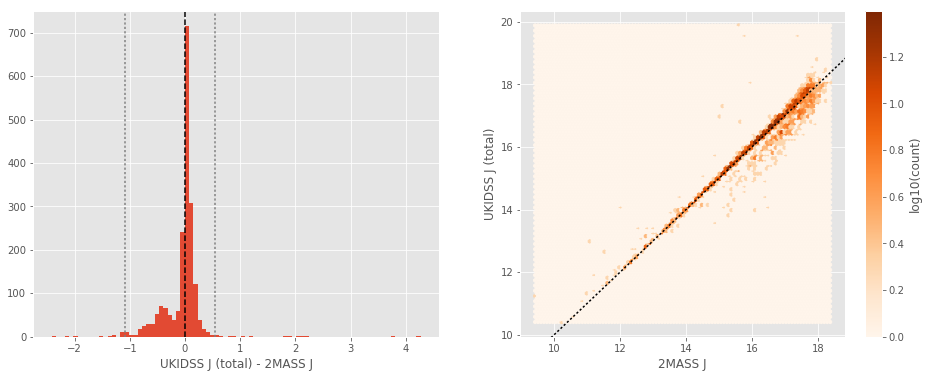

In [16]:
nb_compare_mags(twomass['jmag'] + j_2mass_to_ab, master_catalogue['m_ukidss_j'][ml_twomass_idx],
                labels=("2MASS J", "UKIDSS J (total)"))

UKIDSS Ks-like (total) - 2MASS Ks:
- Median: 0.07
- Median Absolute Deviation: 0.11
- 1% percentile: -1.0089076529558705
- 99% percentile: 1.0822636930219156


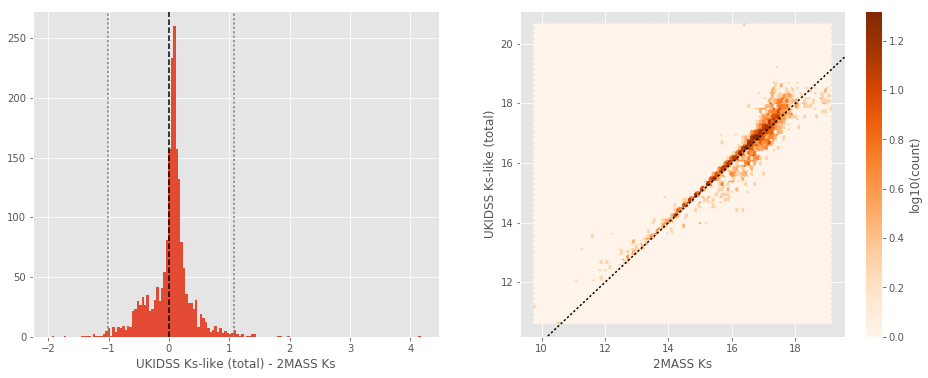

In [17]:
ukidss_ks_like = master_catalogue['m_ukidss_k'] + 0.003 + 0.004 * (
    master_catalogue['m_ukidss_j'] - master_catalogue['m_ukidss_k'])
nb_compare_mags(twomass['kmag'] + k_2mass_to_ab, ukidss_ks_like[ml_twomass_idx],
                labels=("2MASS Ks", "UKIDSS Ks-like (total)"))

WIRCAM J (total) - 2MASS J:
- Median: -0.00
- Median Absolute Deviation: 0.10
- 1% percentile: -1.4933099580289682
- 99% percentile: 3.0649023654268435


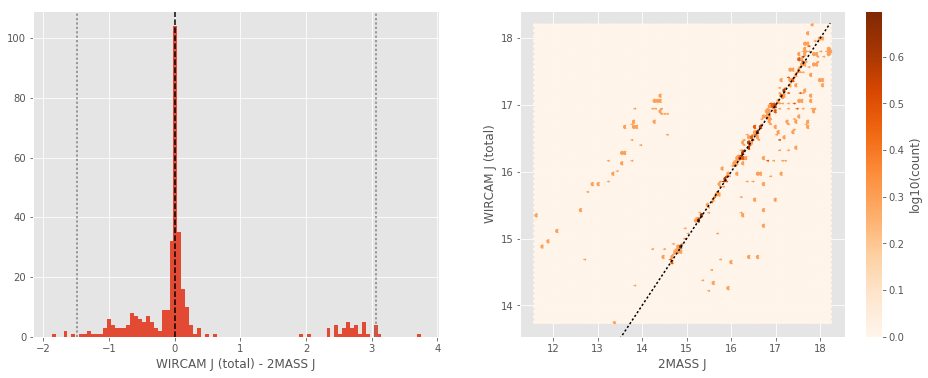

In [18]:
nb_compare_mags(twomass['jmag'] + j_2mass_to_ab, master_catalogue['m_wircam_j'][ml_twomass_idx],
                labels=("2MASS J", "WIRCAM J (total)"))

WIRCAM Ks (total) - 2MASS Ks:
- Median: -0.03
- Median Absolute Deviation: 0.13
- 1% percentile: -1.3042394424303563
- 99% percentile: 1.0053103998700583


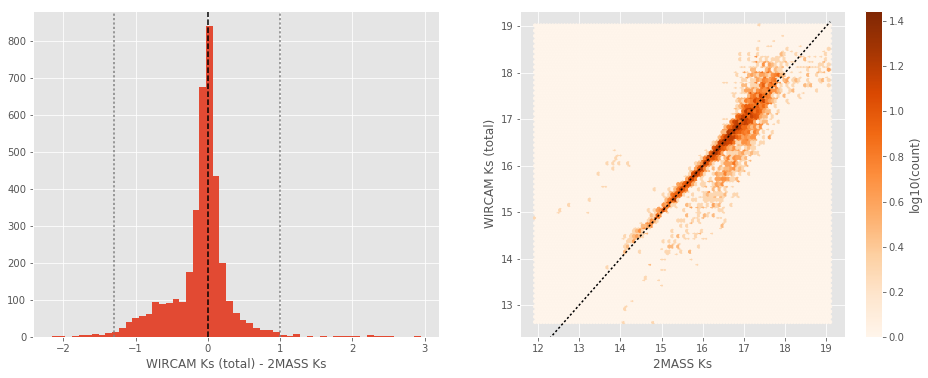

In [19]:
nb_compare_mags(twomass['kmag'] + k_2mass_to_ab, master_catalogue['m_wircam_ks'][ml_twomass_idx],
                labels=("2MASS Ks", "WIRCAM Ks (total)"))

## IV - Comparing aperture magnitudes to total ones.

Number of source used: 4150670 / 8704751 (47.68%)


/opt/anaconda3/envs/herschelhelp_internal/lib/python3.6/site-packages/ipykernel/__main__.py:4: RuntimeWarning: invalid value encountered in subtract


Number of source used: 4718862 / 8704751 (54.21%)
Number of source used: 373246 / 8704751 (4.29%)
Number of source used: 1911606 / 8704751 (21.96%)


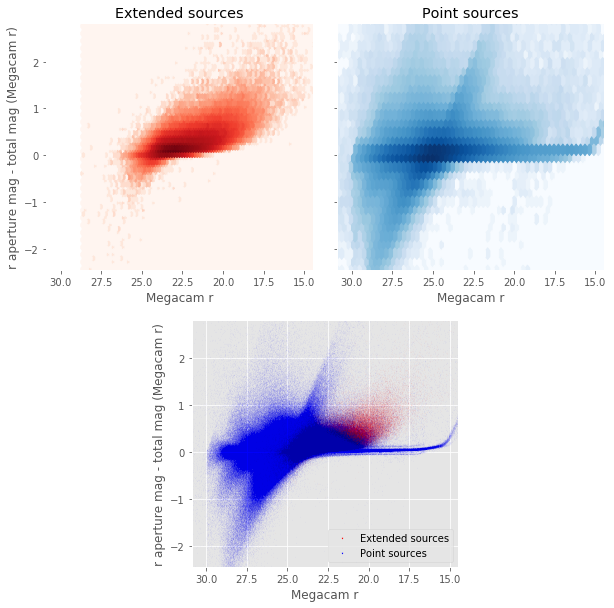

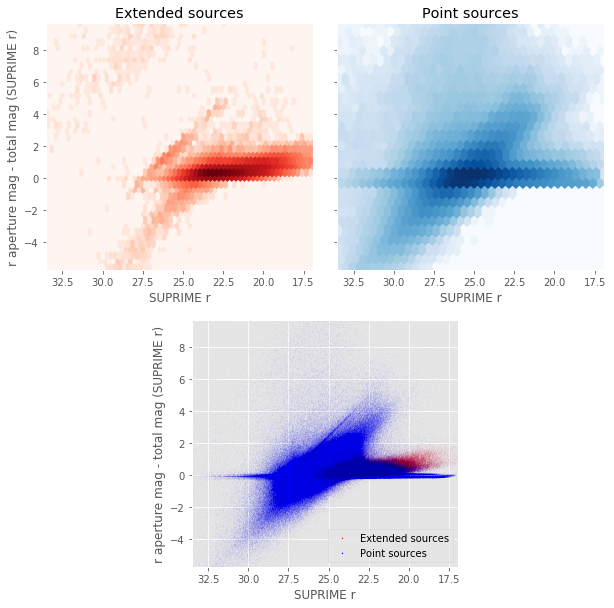

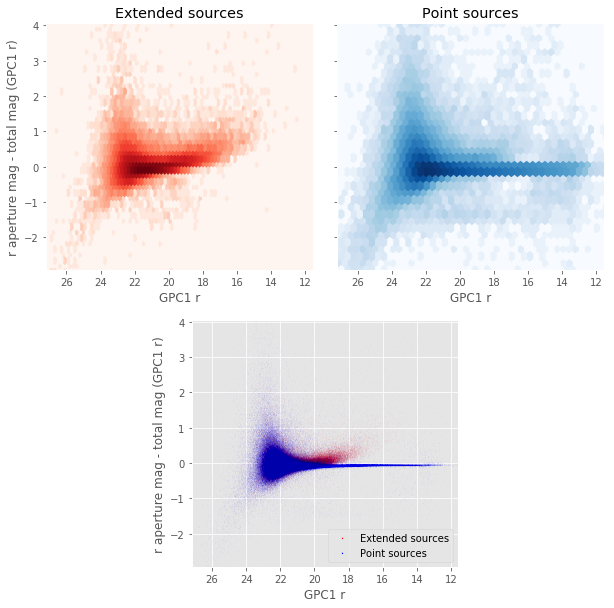

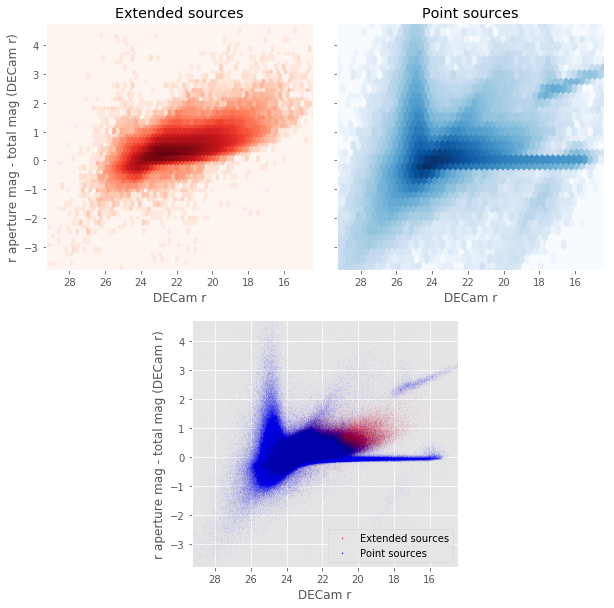

In [20]:
for band in r_bands:
    nb_ccplots(
        master_catalogue["m_{}".format(band.replace(" ", "_").lower())],
        master_catalogue["m_ap_{}".format(band.replace(" ", "_").lower())] - master_catalogue["m_{}".format(band.replace(" ", "_").lower())],
        band, "r aperture mag - total mag ({})".format(band),
        master_catalogue["stellarity"],
        invert_x=True
    )

## V - Color-color and magnitude-color plots

/opt/anaconda3/envs/herschelhelp_internal/lib/python3.6/site-packages/ipykernel/__main__.py:2: RuntimeWarning: invalid value encountered in subtract
  from ipykernel import kernelapp as app


Number of source used: 400163 / 8704751 (4.60%)


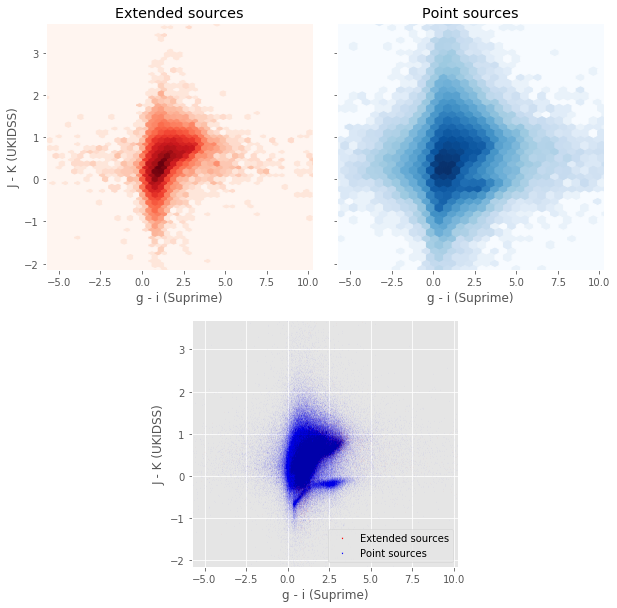

In [21]:
nb_ccplots(
    master_catalogue['m_suprime_g'] - master_catalogue['m_suprime_i'],
    master_catalogue['m_ukidss_j'] - master_catalogue['m_ukidss_k'],
    "g - i (Suprime)", "J - K (UKIDSS)",
    master_catalogue["stellarity"]
)

/opt/anaconda3/envs/herschelhelp_internal/lib/python3.6/site-packages/ipykernel/__main__.py:3: RuntimeWarning: invalid value encountered in subtract
  app.launch_new_instance()


Number of source used: 726028 / 8704751 (8.34%)


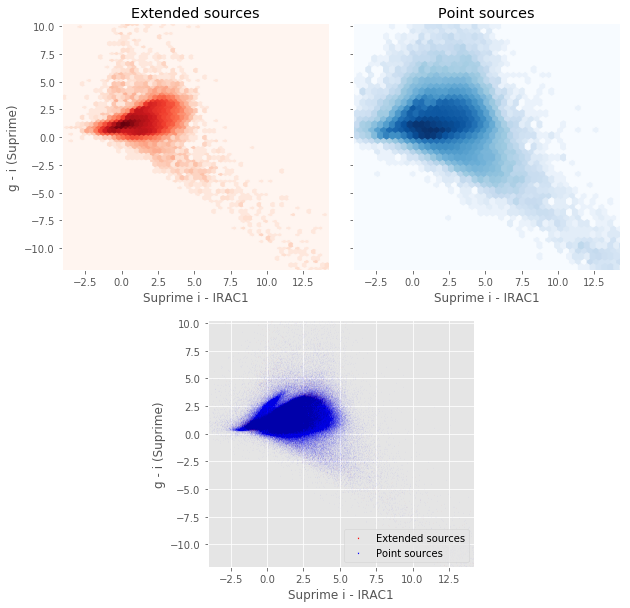

In [22]:
nb_ccplots(
    master_catalogue['m_suprime_i'] - master_catalogue['m_irac_i1'],
    master_catalogue['m_suprime_g'] - master_catalogue['m_suprime_i'],
    "Suprime i - IRAC1", "g - i (Suprime)",
    master_catalogue["stellarity"]
)

Number of source used: 3640711 / 8704751 (41.82%)


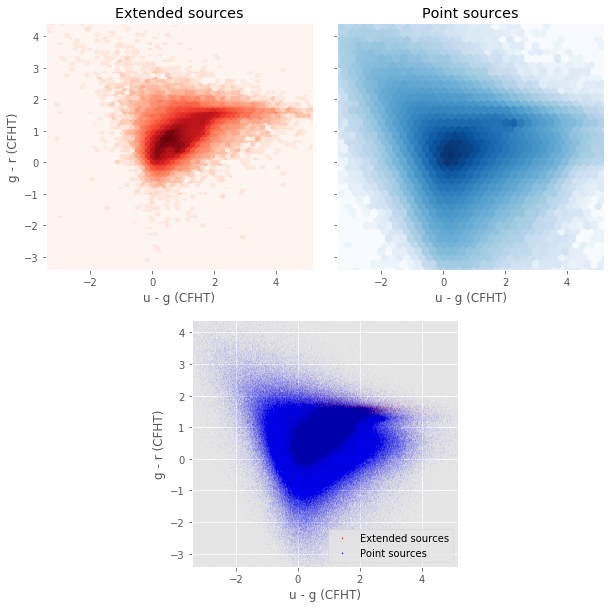

In [23]:
nb_ccplots(
    master_catalogue['m_megacam_u'] - master_catalogue['m_megacam_g'],
    master_catalogue['m_megacam_g'] - master_catalogue['m_megacam_r'],
    "u - g (CFHT)", "g - r (CFHT)",
    master_catalogue["stellarity"]
)

Number of source used: 403445 / 8704751 (4.63%)


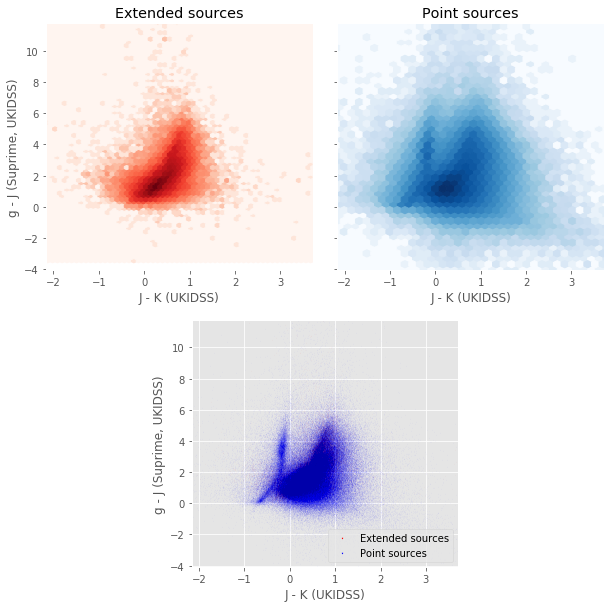

In [24]:
nb_ccplots(
    master_catalogue['m_ukidss_j'] - master_catalogue['m_ukidss_k'],
    master_catalogue['m_suprime_g'] - master_catalogue['m_ukidss_j'],
    "J - K (UKIDSS)", "g - J (Suprime, UKIDSS)",
    master_catalogue["stellarity"]
)

/opt/anaconda3/envs/herschelhelp_internal/lib/python3.6/site-packages/ipykernel/__main__.py:2: RuntimeWarning: invalid value encountered in subtract
  from ipykernel import kernelapp as app


Number of source used: 426099 / 8704751 (4.90%)


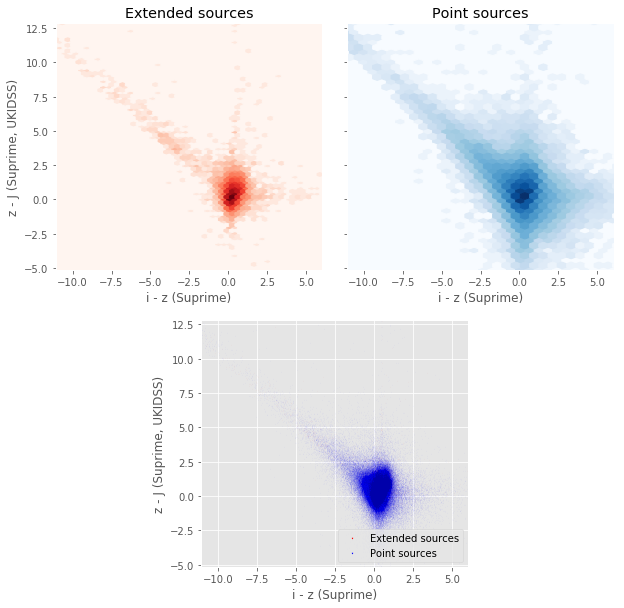

In [25]:
nb_ccplots(
    master_catalogue['m_suprime_i'] - master_catalogue['m_suprime_z'],
    master_catalogue['m_suprime_z'] - master_catalogue['m_ukidss_j'],
    "i - z (Suprime)", "z - J (Suprime, UKIDSS)",
    master_catalogue["stellarity"]
)

/opt/anaconda3/envs/herschelhelp_internal/lib/python3.6/site-packages/ipykernel/__main__.py:3: RuntimeWarning: invalid value encountered in subtract
  app.launch_new_instance()


Number of source used: 35564 / 8704751 (0.41%)


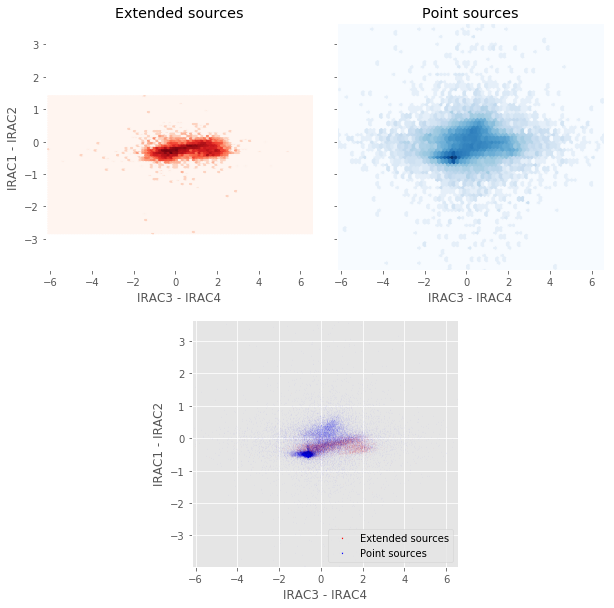

In [26]:
nb_ccplots(
    master_catalogue['m_irac_i3'] - master_catalogue['m_irac_i4'],
    master_catalogue['m_irac_i1'] - master_catalogue['m_irac_i2'],
    "IRAC3 - IRAC4", "IRAC1 - IRAC2",
    master_catalogue["stellarity"]
)